==============================================================================================
## Practicum 4: Descriptors extraction for object detection, based on template matching, ORB, and HOG
==============================================================================================

In this laboratory we will treat the following main topics:

1) Template matching
    - Normalized Cross-correlation
    - Application to object (eye) detection 

2) Image Descriptors: "Sliding window" and HOG image descriptor
   - Application to object (car) detection

3) Image matching (recognition by correspondance) based on feature extraction (ORB)
    - Application to object (logo) detection
    
In order to complete this practicum, the following concepts need to be understood: template matching, feature localization (Harris, Censure), feature descriptor (HOG,ORB, Sift) methods.

All code should be commented in English. Answers of the questions and comments on the exercises should be given in English too.

It is highly recommendable to structure the code in functions in order to reuse code for different tests and images and make it shorter and more readable. Specially the visualization commands should be encapsulated in separate functions.

### Imports and others

In [1]:
from skimage.feature import match_template, hog, match_descriptors, corner_harris, corner_peaks, ORB, plot_matches
from skimage import img_as_float, color, data, exposure, transform
from skimage.color import rgb2gray
import random

In [2]:
"""
This first function allow us to display a subplot with different images

:param titles: list of the titles of each image
:param images: list of each image
:param nrows, ncolumns: number of rows and number of columns of the subplot
:return: in case of out of range
"""
def plotter(images=[],titles=[],gray=[],rows=0,cols=0):
    
    if (rows*cols) < (len(images)): #We must check if we have one cell per image
        print("Attention! The dimensions of the subplot are incorrect!")
        return
    
    fig, axs = plt.subplots(nrows=rows, ncols=cols, figsize=(10, 10)) #Create the subplot

    count = 0 #Index of both arrays (titles and images)
    total = len(images)
    
    for i in range(rows): #Iterate over the subplot
        for j in range(cols):
            if count<total:
                if rows == 1 and cols == 1:
                    im = axs
                elif rows==1:
                    im = axs[j]
                else:
                    im = axs[i,j]
                im.axis('off') # remove the axis values
                im.set_title(titles[count]) #Set the title
                if gray[count]:
                    im.imshow(images[count],cmap='gray')
                else:
                    im.imshow(images[count])
                
            else:
                im = axs[i,j]
                im.axis('off')
            count += 1
            
    plt.show() #Finally display the subplot

In [3]:
"""
Function that allows mark the matching as we did previously with the red circle

:param image: image to find the match
:param template: template to find the match
:param index: this is the index where we found the matching between hog descriptors
:return: the image same imput image with a red frame in the matching window
"""
def red_frame(image, template, index):
    #First we need the rgb image to set the values in red
    image = color.gray2rgb(image)
    
    #We must pick the necessary corners 
    right_corner = index[1]+template.shape[1]
    down_corner = index[0]+template.shape[0]

    #Now we make the frame
    image[index[0]:down_corner,index[1]:index[1]+1,:]=(255,0,0)
    image[index[0]:down_corner,right_corner-1:right_corner,:]=(255,0,0)
    image[index[0]:index[0]+1,index[1]+1:right_corner-1,:]=(255,0,0)
    image[down_corner-1:down_corner,index[1]+1:right_corner-1,:]=(255,0,0)
    
    return image

In [4]:
"""
This function apply the ORB feature detector between 2 images without displaying

:param image1: image1 to compare with image2
:param image2: image2 to compare with image1
:return: The number of matches between both images
"""
def ORB_feature_detector_no_display(image1, image2):
    #Extract descriptor with n_keypoints = 200 as in the example
    descriptor_extractor = ORB(n_keypoints=200)

    #Need the descriptors from both images
    descriptor_extractor.detect_and_extract(image1)
    keypoints1 = descriptor_extractor.keypoints #Get the points where we found a match
    descriptors1 = descriptor_extractor.descriptors
    
    descriptor_extractor.detect_and_extract(image2)
    keypoints2 = descriptor_extractor.keypoints #Get the points where we found a match
    descriptors2 = descriptor_extractor.descriptors

    #Here we're getting an array of pixels that match between the previous images
    matches12 = match_descriptors(descriptors1, descriptors2, cross_check=True)

    return len(matches12)

## 4.1 Template matching

4.1.1 Given the image 'einstein.png' and the template 'eye.png', detect the location of the template in the image comparing the use of:
- euclidean distance (hint: norm() in numpy.linalg).
- normalized cross-correlation (hint: match_template() of skimage.feature).

Hint: you can take as an example, the template matching on the [coin exercise](http://scikit-image.org/docs/dev/auto_examples/features_detection/plot_template.html#sphx-glr-auto-examples-features-detection-plot-template-py) in skimage.
Don't forget to normalize the images (having pixel values between [0,1]) before comparing them.

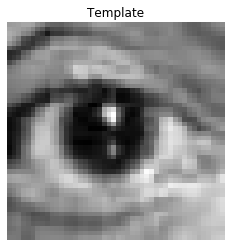

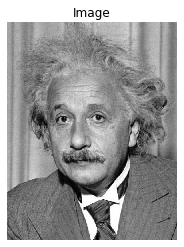

In [5]:
from skimage import io
from matplotlib import pyplot as plt
import numpy as np
%matplotlib inline

#Load the images
template=io.imread('./images/eye.png')
image=io.imread('./images/einstein.png')

#First we have to get the normalized images from the original and also convert them in grayscale
template = color.rgba2rgb(template)
template = color.rgb2gray(template)
template = img_as_float(template)

image = color.rgba2rgb(image)
image = color.rgb2gray(image)
image = img_as_float(image)

#Display 'em
plt.title("Template")
plt.axis('off')
plt.imshow(template, cmap='gray')
plt.show()

plt.title("Image")
plt.axis('off')
plt.imshow(image, cmap='gray')
plt.show()

In [39]:
''' Visualization and template matching functions definition '''
"""
Function that use the sliding window technique to use the euclidian distance between template and the image

:param image: image to find the match
:param template: template to find the match
:return: result of applying euclidean distance by sliding window, index of the minimum difference (which means, the more correlation)
"""
def euclidean_distance(image, template):
    image, template = img_as_float(image), img_as_float(template)
    
    #we will give to the original image a frame of zeros, this is just to ensure that we won't get an out of range index 
    image_padded = np.zeros((image.shape[0] + template.shape[0], image.shape[1] + template.shape[1]))
    image_padded[int(template.shape[0]/2):-int(template.shape[0]/2), int(template.shape[1]/2):-int(template.shape[1]/2)] = image
    
    #convolution
    result = np.zeros_like(image)
    for x in range(image.shape[1]):
        for y in range(image.shape[0]):
            result[y,x] = np.linalg.norm(template-image_padded[y:y + template.shape[0], x:x + template.shape[1]])
    
    #we invert the result to get the most relevant values (0 to 1)
    result = img_as_float(result)
    
    index = np.unravel_index(np.argmin(result), result.shape)
    
    return result, index[0], index[1] 
            
"""
Function that use the matching function 'match_template' of the module feature, which does the same effect that 
normalized_cross_correlation

:param image: image to find the match
:param template: template to find the match
:return: result of applying normalized cross correlation, index of the maximum difference (which means, the more correlation)
"""
def normalized_cross_correlation(image, template):
    image, template = img_as_float(image), img_as_float(template)
    
    norm_cc = match_template(image, template)
    index = np.unravel_index(np.argmax(norm_cc), norm_cc.shape)
    
    return norm_cc, index[0], index[1]

"""
Function that make a subplot to organize the different images in the process of matchig template

:param image: image to find the match
:param template: template to find the match
:param result: result of the matching template technique
:param index_correlation: index with the more correlation between image and template
"""
def visualize_result(_image, template, result,  index_correlation=tuple):
    f, axarr = plt.subplots(ncols=4, nrows=1,figsize=(15,15))
    
    axarr[0].axis('off')
    axarr[0].imshow(template, cmap='gray')
    axarr[0].set_title('Template used')
        
    axarr[1].axis('off')
    axarr[1].imshow(_image, cmap='gray')
    axarr[1].set_title('Original image')
    
    axarr[2].axis('off')
    axarr[2].imshow(result, cmap='gray')
    axarr[2].set_title('Result of the matching function')
    axarr[2].plot(index_correlation[1], index_correlation[0], 'o', markeredgecolor='r', markerfacecolor='none', markersize=10)
    
    axarr[3].axis('off')
    axarr[3].imshow(_image, cmap='gray')
    axarr[3].set_title('Match identification')
    axarr[3].plot(index_correlation[1], index_correlation[0], 'o', markeredgecolor='r', markerfacecolor='none', markersize=10)

339 201
316 178


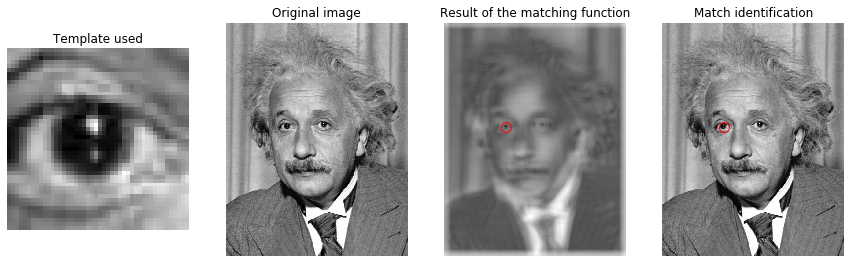

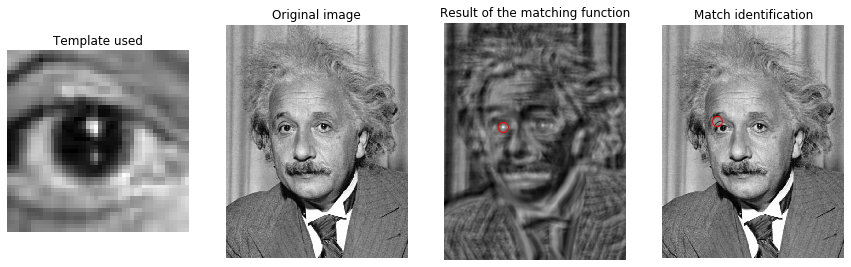

In [40]:
#Apply both techinques
result_euc, x_euc, y_euc = euclidean_distance(image, template)
result_normcc, x_norm, y_norm = normalized_cross_correlation(image, template)
print(x_euc, y_euc)
print(x_norm, y_norm)
#It took about ~5s to the computer to calculate all
visualize_result(image, template, result_euc, index_correlation = (x_euc,y_euc))
visualize_result(image, template, result_normcc, index_correlation = (x_norm,y_norm))

4.1.2 How does the result of the template matching change if the image changes its contrast (for example if you make it clearer or darker)? To this purpose, read the images "einstein_br.png" and "einstein_mask.png".

Visualize the normalized cross-correlation image between the template and the image as well as this very same image in a binarized form in order to show where is the minimal distance between the template and the image. 
* How does the minimum distance between the template and the image change? 
* What are the minimal distance pixels in the correlation images? 
* What are the distances between the template and the image around the eyes of the image? 

Use titles of the figures to explain what is displayed.


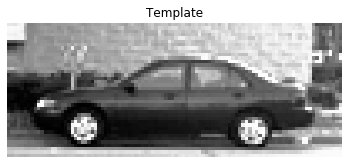

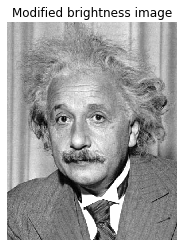

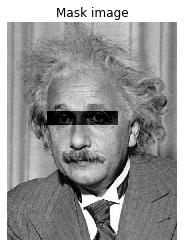

In [59]:
#Load the images
image_br=io.imread('./images/einstein_br.png')
image_mask=io.imread('./images/einstein_mask.png')

#First we have to get the normalized images from the original (we already have the grayscale images)
image_br = img_as_float(image_br)
image_mask = img_as_float(image_mask)

#Display 'em
plt.title("Template")
plt.axis('off')
plt.imshow(template, cmap='gray')
plt.show()

plt.title("Modified brightness image")
plt.axis('off')
plt.imshow(image_br, cmap='gray')
plt.show()

plt.title("Mask image")
plt.axis('off')
plt.imshow(image_mask, cmap='gray')
plt.show()

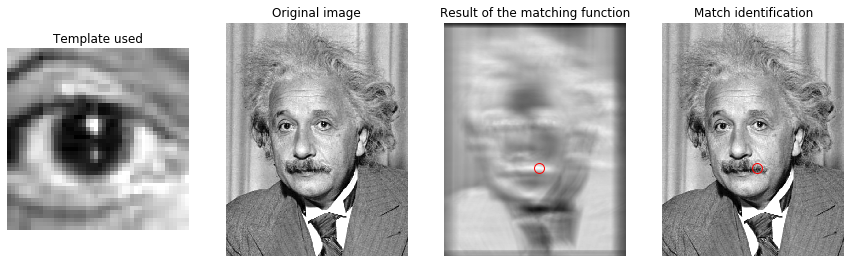

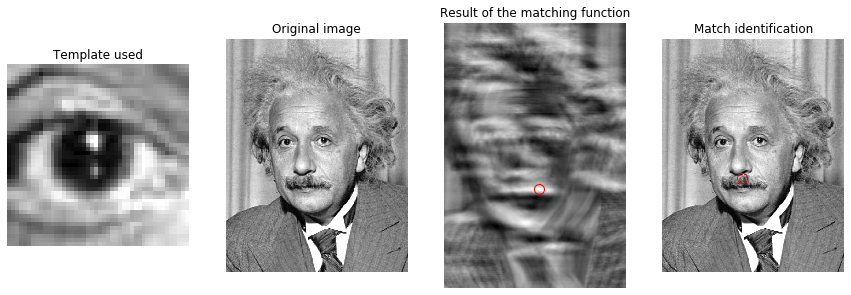

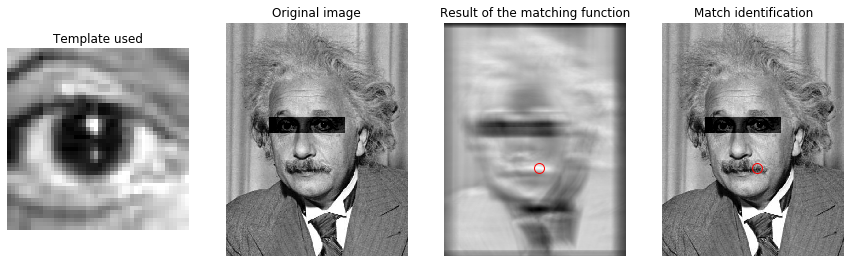

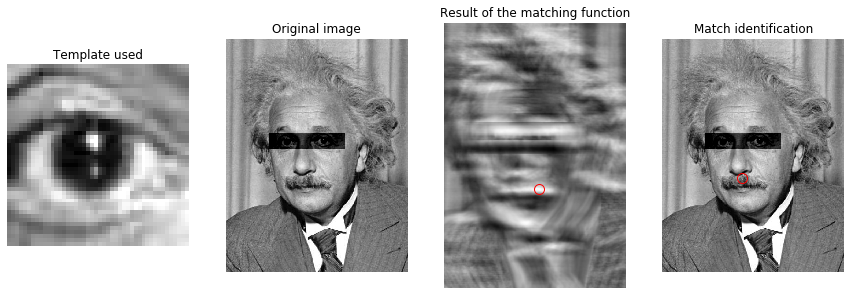

In [60]:
#Apply both techinques with the modified brightness and the einstein_mask
result_euc_br, x_euc_br, y_euc_br = euclidean_distance(image_br, template)
result_normcc_br, x_norm_br, y_norm_br = normalized_cross_correlation(image_br, template)
result_euc_mask, x_euc_mask, y_euc_mask = euclidean_distance(image_mask, template)
result_normcc_mask, x_norm_mask, y_norm_mask = normalized_cross_correlation(image_mask, template)

#It took about ~10s to the computer to calculate all
template_br=io.imread('./images/eye_br.png')
template_br = img_as_float(template_br)

visualize_result(image_br, template_br, result_euc_br, index_correlation = (x_euc_br,y_euc_br))
visualize_result(image_br, template_br, result_normcc_br, index_correlation = (x_norm_br,y_norm_br))
visualize_result(image_mask, template_br, result_euc_mask, index_correlation = (x_euc_mask,y_euc_mask))
visualize_result(image_mask, template_br, result_normcc_mask, index_correlation = (x_norm_mask,y_norm_mask))

As we can see with a brightness modified image we can obtain the same results as before, because we've normalized the image before like we did previously.

In the case of the mask image of Albert Einstein, we have that the part of the eyes is darker respect the rest of the image. 

With the euclidian distance technique we look for the minimum difference between the values of both template and image, and in this case we can see that we've failed in the matching. So this is because the eyes were darker.

But in the normalized cross correlation we can see that the match was successful. This is because this technique only considers the proportional difference between the image and the template.

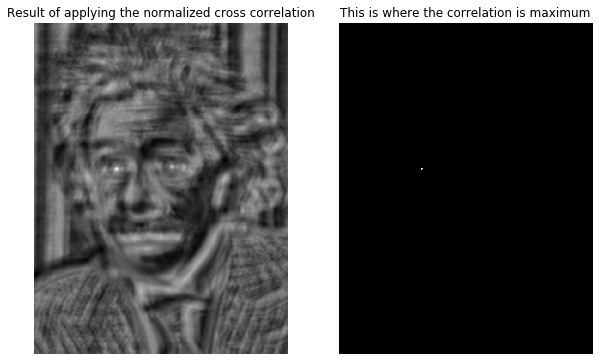

In [61]:
#We're gonna take the previous result of the image computed with the normalized cross correlation
#to apply a mask and see the pixels with most correlation 
result_normcc_bin = np.zeros_like(result_normcc)
result_normcc_bin[result_normcc >= 0.8] = 1

#Finally plot the result
plotter(images=[result_normcc,result_normcc_bin],
        titles=["Result of applying the normalized cross correlation","This is where the correlation is maximum"],
        gray=[True,True],rows=1,cols=2)

### Answering questions

We can see that while both algorithms are computing differences between the image and the template and usually the values are high. But when we arrive at the point where the image and also the template are equal the difference between the values are minimum. Is for this fact that the previous methods are 'more or less' good tho find matches.

We can observe that the minimal distance pixels in the correlation images are situated in the eyes of Albert Einstein.

The distances between the template and the image around the eyes of the image are big and they're not good enought to say that there is a match in that point of the image.

In [73]:
einstein = rgb2gray(io.imread('images/einstein.png'))
eye = rgb2gray(io.imread('images/eye.png'))
original_result,_,_ = euclidean_distance(einstein,eye)
original_result = 1-original_result
minim = np.min(original_result)

print("Eye distance: ",minim)
indices = np.unravel_index(np.argmin(original_result),original_result.shape)

print("Distance around the eye: ")
for i,j in [(-1,-1),(-1,0),(-1,1),(0,-1),(0,1),(1,-1),(1,0),(1,1)]:
    i_aux, j_aux = indices[0]+i,indices[1]+j
    print(original_result[i_aux,j_aux])

Eye distance:  1.9895304595412764
Distance around the eye: 
4.829841239372098
3.2914298091238527
3.5227366070449233
4.09538707688252
2.4705539991403156
5.425305594342412
4.45661904218851
4.705972221364112


4.1.3 How does the result of the template matching changes if instead the template is the one that changes its contrast (for example if you make it clearer or darker)? To this purpose, use the 'eye_br.png' template.

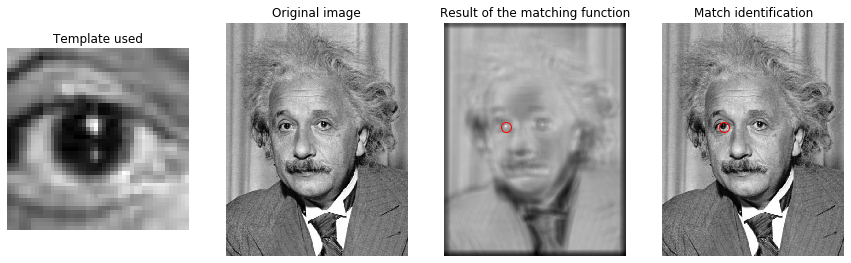

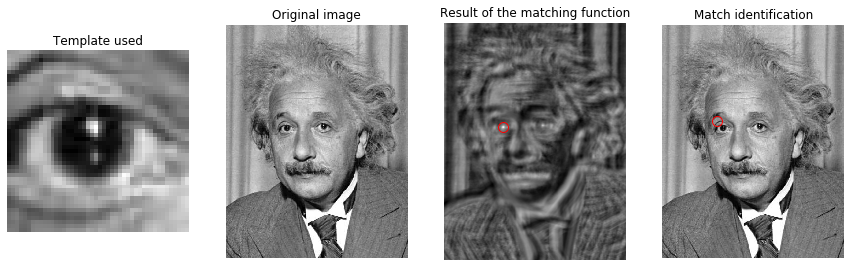

In [55]:
#Load and normalize
template_br=io.imread('./images/eye_br.png')
template_br = img_as_float(template_br)

#Apply both techinques with br template
result_euc_2, x_euc2, y_euc2 = euclidean_distance(image, template_br)
result_normcc_2, x_norm2, y_norm2 = normalized_cross_correlation(image, template_br)

#It took about ~5s to the computer to calculate all
visualize_result(image, template, result_euc_2, index_correlation = (x_euc2,y_euc2))
visualize_result(image, template, result_normcc_2, index_correlation = (x_norm2,y_norm2))

We can say that there is no changes changing the brightness of the template, because we're normalizing first as usual.

4.1.4 Check how the result changes if the template is rotated. Visualize the template and its rotation by 10º, 15º and 20º. Obtain again the template matching using the Euclidean distance and normalized cross-correlation.
Help: use the function rotate() in skimage.transform

Comment what is the template matching process, what advantages and disadvantages it has, how sensible is to image deformation in photometric and spatial dimensions, what parameters it has and which measure for image comparisons works better.

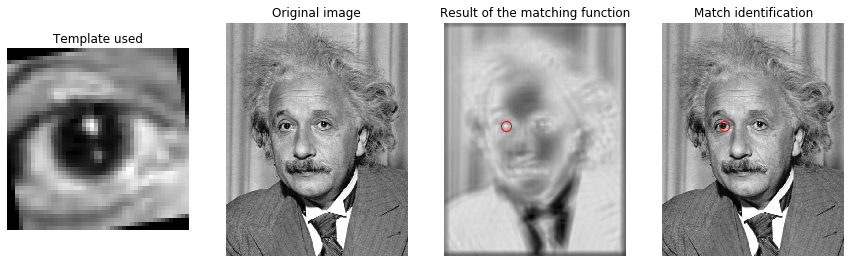

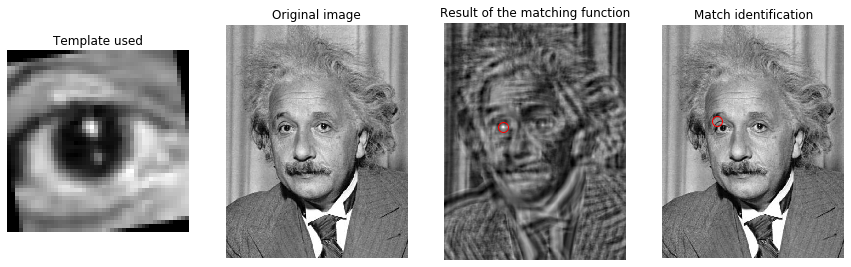

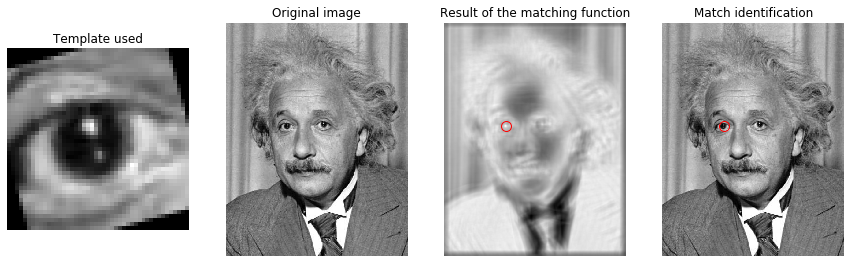

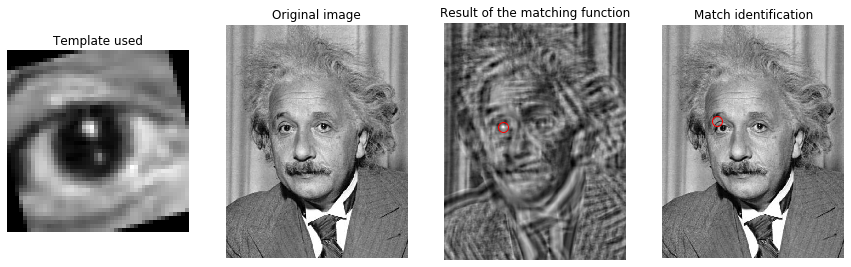

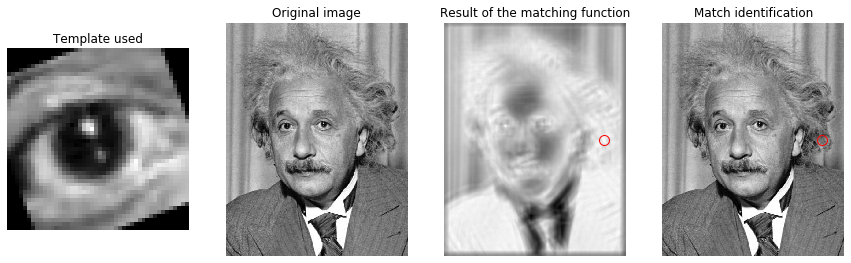

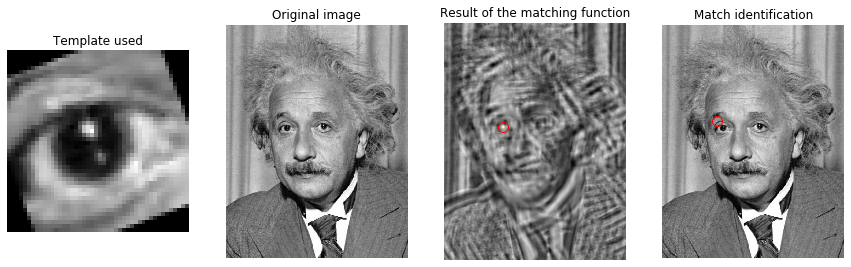

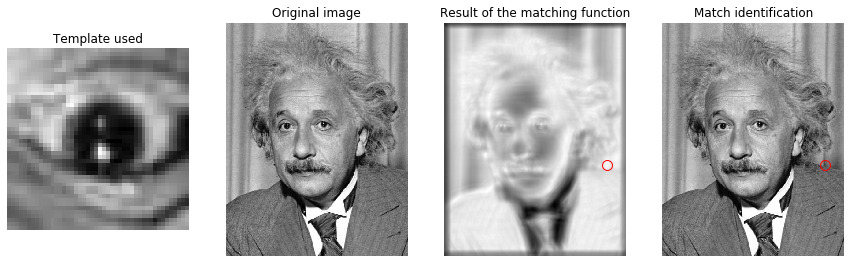

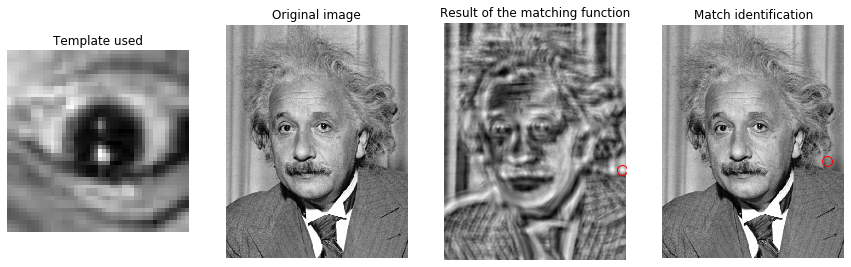

In [56]:
#First rotate the template images
temp_10 = transform.rotate(template, 10)
temp_15 = transform.rotate(template, 15)
temp_20 = transform.rotate(template, 20)

#Extra
temp_180 = transform.rotate(template, 180)

#Apply both techinques with the rotated templates
result_euc_10, x_euc_10, y_euc_10 = euclidean_distance(image, temp_10)
result_normcc_10, x_norm_10, y_norm_10 = normalized_cross_correlation(image, temp_10)
result_euc_15, x_euc_15, y_euc_15 = euclidean_distance(image, temp_15)
result_normcc_15, x_norm_15, y_norm_15 = normalized_cross_correlation(image, temp_15)
result_euc_20, x_euc_20, y_euc_20 = euclidean_distance(image, temp_20)
result_normcc_20, x_norm_20, y_norm_20 = normalized_cross_correlation(image, temp_20)

#Extra
result_euc_180, x_euc_180, y_euc_180 = euclidean_distance(image, temp_180)
result_normcc_180, x_norm_180, y_norm_180 = normalized_cross_correlation(image, temp_180)


#It took about ~17s to the computer to calculate all
visualize_result(image, temp_10, result_euc_10, index_correlation = (x_euc_10,y_euc_10))
visualize_result(image, temp_10, result_normcc_10, index_correlation = (x_norm_10,y_norm_10))
visualize_result(image, temp_15, result_euc_15, index_correlation = (x_euc_15,y_euc_15))
visualize_result(image, temp_15, result_normcc_15, index_correlation = (x_norm_15,y_norm_15))
visualize_result(image, temp_20, result_euc_20, index_correlation = (x_euc_20,y_euc_20))
visualize_result(image, temp_20, result_normcc_20, index_correlation = (x_norm_20,y_norm_20))

#Extra
visualize_result(image, temp_180, result_euc_180, index_correlation = (x_euc_180,y_euc_180))
visualize_result(image, temp_180, result_normcc_180, index_correlation = (x_norm_180,y_norm_180))

### Answering questions

A template matching process is a process which consists in comparing the template image moving it in sliding windows in a bigger image trying to find a match (a big correlation in the values of the template and the image). There are diverse techniques to find this correlation, but in our case we did it with euclidian distance and the normalized cross correlation. This process is also enought fast, but there is many other inconvenients.

As the main inconvenients we must say that this method is weak when: we rotate the image or the template, we resize the dimension of any of the images and also if we change dramatically the contrast or brightness in any of the images.

We will see that there are so many other techniques that implements other improvements that helps to avoid the previous inconvenients.

# 4.2 Histogram of Oriented Gradients


The Histogram of Oriented Gradients (HOG) feature descriptor is classical image descriptor for object detection.

Given the image 'car_template.png' and the folder 'cars', apply the HOG descriptor in order to detect where there is a car in the images in the folder 'car'. To this purpose, apply the "sliding window" technique. The algorithm can be:

a) Read the car template ('car_template.png') and obtain its HOG descriptor. Visualize it. [Help](http://scikit-image.org/docs/dev/auto_examples/features_detection/plot_hog.html#sphx-glr-auto-examples-features-detection-plot-hog-py) 

b) Read images from the folder "car", slide a window on each image, obtain the HOG descriptor and compare to the HOG descriptor of the car template. 

c) Visualize the location in the image that is the most similar to the car template. What distance will you use to compare both HOG descriptors of the car template and the image region? Compare if there is any difference in their results. 

d) Compute in how many images the cars were detected correctly and discuss the algorithm failures. What do you think can be the reasons for the failure?

Hint: the HOG detector function is in the skimage.feature library. 

If you want to accelerate algorithm execution, you can apply the sliding window with a step of X pixels (e.g. X=5).

Discuss what is the HOG descriptor, what are the parameters of the algorithm, which are the optimal values for the car detection testing several values of the parameters up to your criterion. Do you see any advantages of the HOG-based object detector compared to the template-based object detection? (The answer should be up to 10-15 lines).

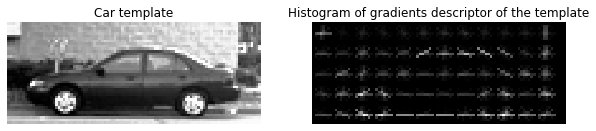

In [57]:
''' Visualization and HOG functions definition '''

#a) Read the car template ('car_template.png') and obtain its HOG descriptor. Visualize it.

#First load the template
template = io.imread("./images/car_template.png")

#Using the hog function from feature module from skimage. Set visualize True to obtain its HOG descriptor
templ_desc, visual_hog = hog(template, visualize = True)

#Plot the images
plotter(images=[template, visual_hog], titles=["Car template", "Histogram of gradients descriptor of the template"],gray=[True,True],rows=1,cols=2)

In [58]:
"""
Function that apply the sliding-window method and then compute the squared norm between the template hog descriptor
and the windows hog descriptor. Then show the result

:param image: image to find the match
:param template: template to find the match
:param template_descriptor: hog descriptor for the template
:param min_val: in order to get the minimum value of the norm (more correlation)
"""
def match_hog(image, template, template_descriptor, min_val=float("inf")):

    #Extract the hog descriptor and also it's image to compare (window by window) with the descriptor of the template
    hog_desc, visual_hog = hog(image, visualize = True)

    #Sliding-window method accelerating the algorithm execution with steps of 5 pixels
    for m in range(0, image.shape[0] - template.shape[0], 5):
        for n in range(0, image.shape[1] - template.shape[1], 5):
            image_window = image[m : m + template.shape[0], n : n + template.shape[1]]
            
            #Compute the window hog descriptor and the squared norm of the difference with 
            #the template hog descriptor as we saw in theory class
            cur_desc = hog(image_window)
            sq_norma = np.square(np.linalg.norm(cur_desc - template_descriptor))
            
            #We want always the minimum value and where is situated the window
            if(sq_norma < min_val):
                min_val = sq_norma
                index = (m, n)
        
    #Finally show the matching using a red frame to visualize better
    visual_hog = red_frame(visual_hog, template, (index[0], index[1]))
    image = red_frame(image, template, (index[0], index[1]))

    #Plot the results
    plotter(images=[image,visual_hog],titles=["Matching template", "Result of HOG descriptors coparision"],gray=[True,True],rows=1,cols=2)

Image number  1


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


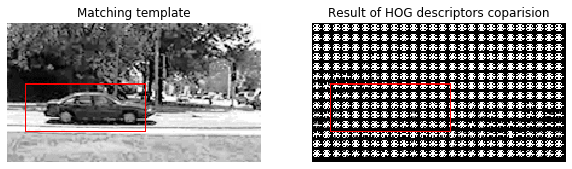

Image number  2


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


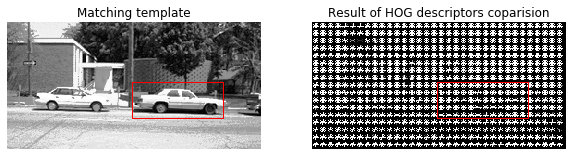

Image number  3


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


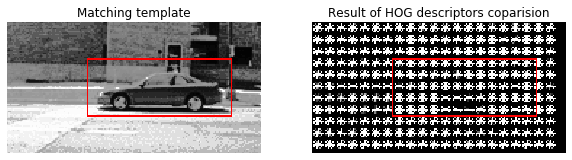

Image number  4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


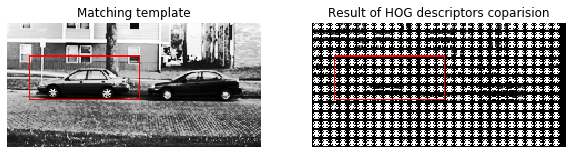

Image number  5


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


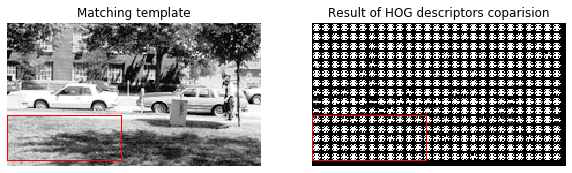

Image number  6


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


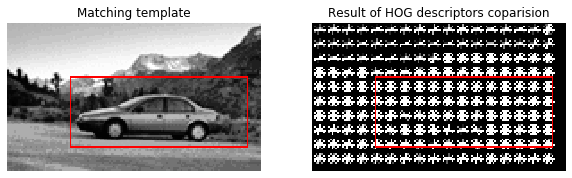

Image number  7


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


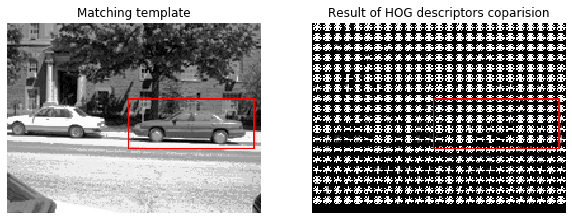

Image number  8


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


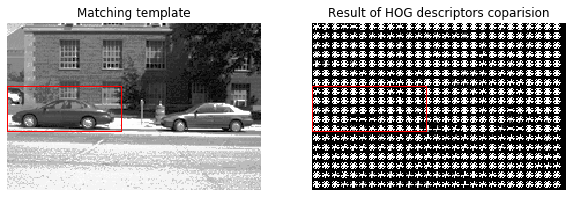

Image number  9


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


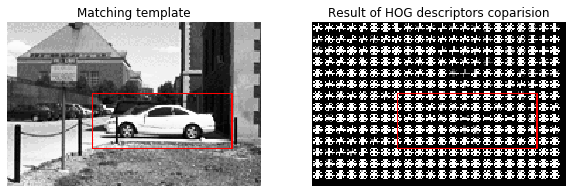

Image number  10


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


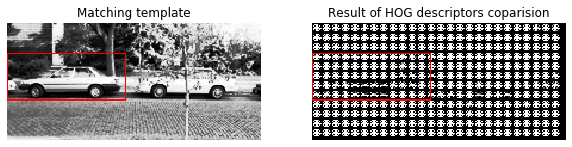

Image number  11


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


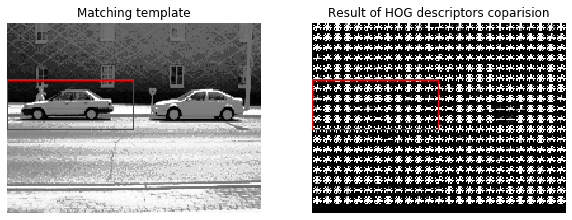

Image number  12


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


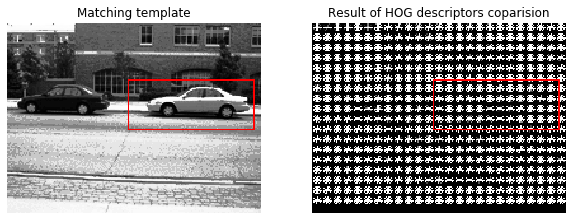

Image number  13


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


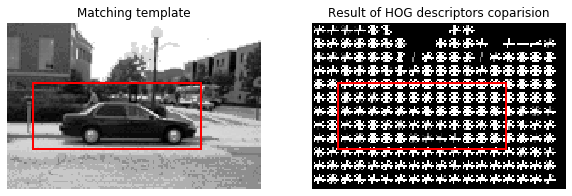

Image number  14


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


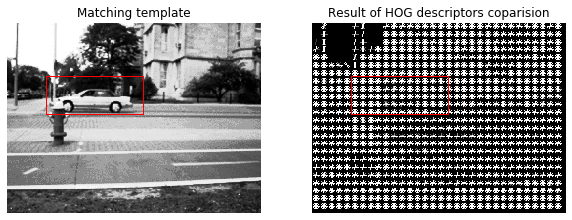

Image number  15


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


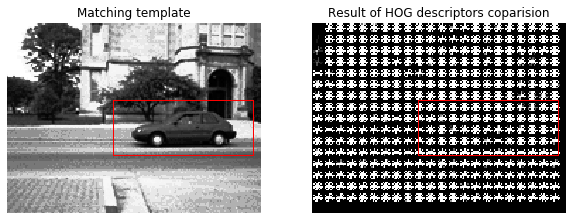

Image number  16


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


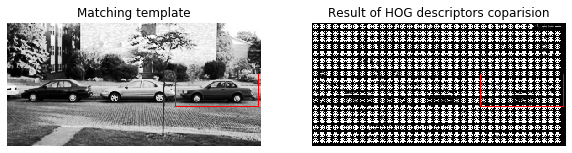

Image number  17


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


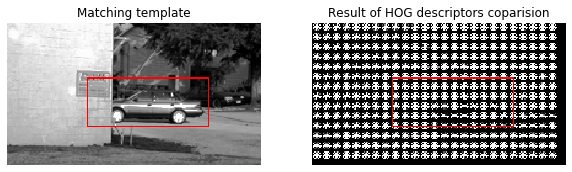

Image number  18


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


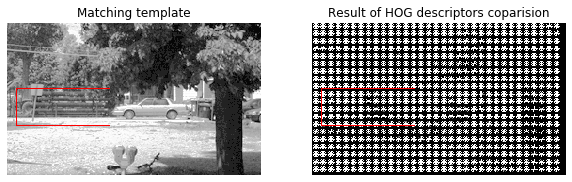

Image number  19


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


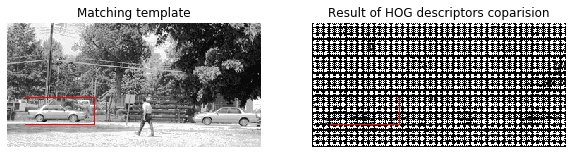

Image number  20


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


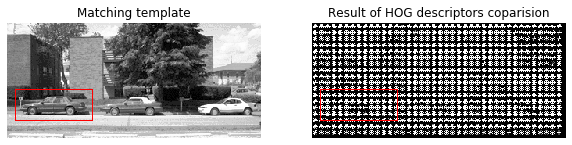

Image number  21


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


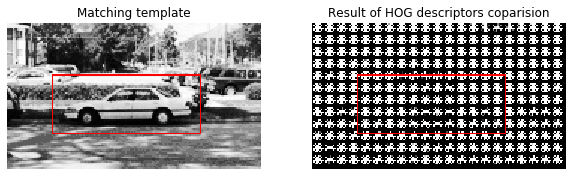

Image number  22


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


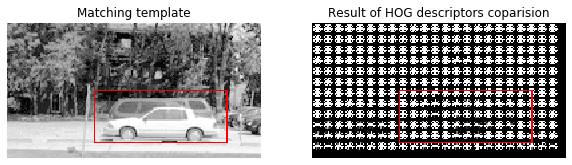

Image number  23


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


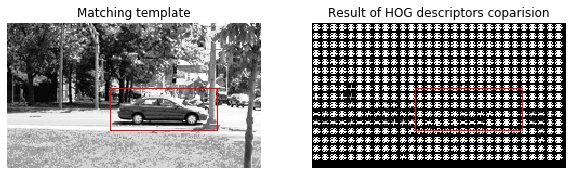

Image number  24


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


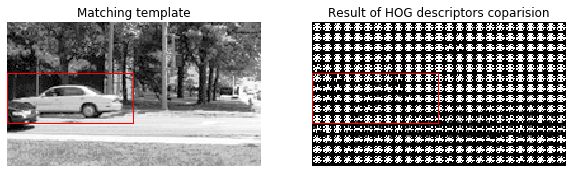

Image number  25


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


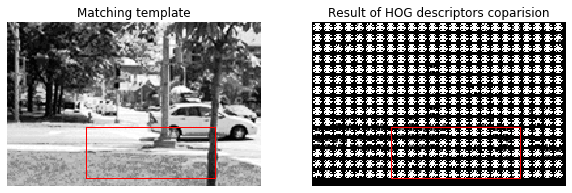

Image number  26


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


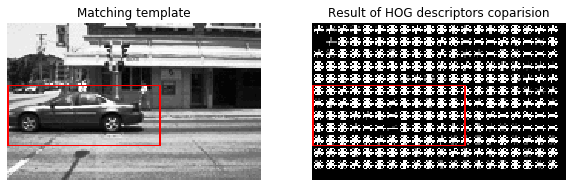

Image number  27


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


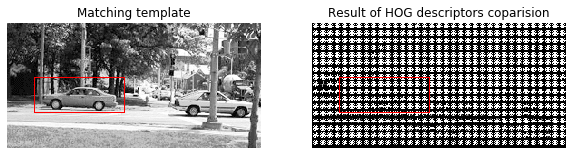

Image number  28


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


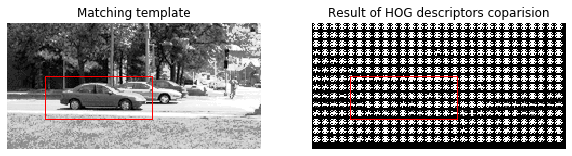

Image number  29


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


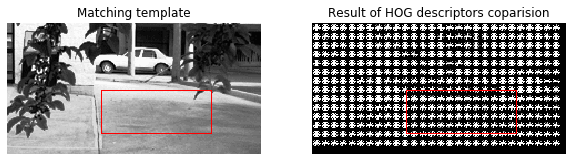

Image number  30


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


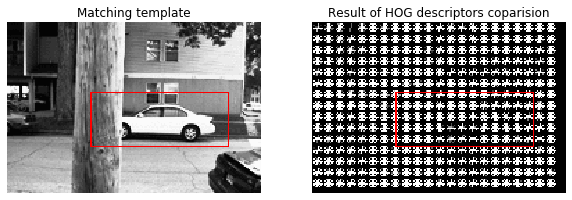

Image number  31


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


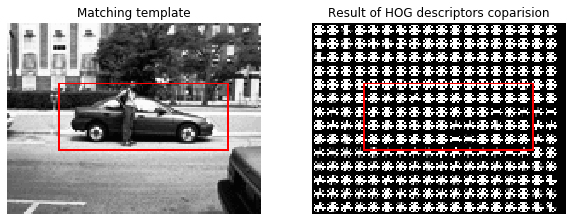

Image number  32


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


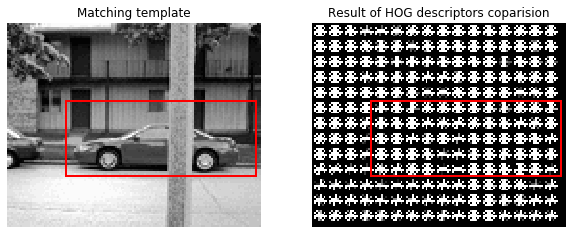

Image number  33


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


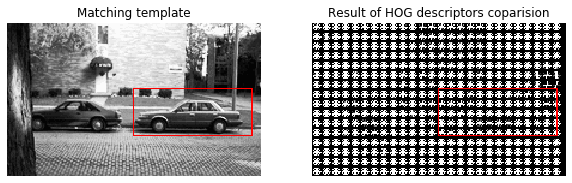

Image number  34


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


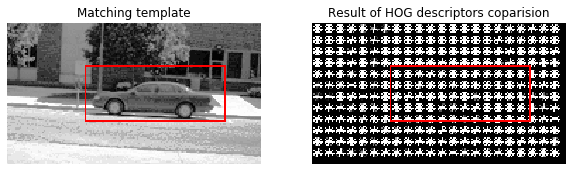

Image number  35


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


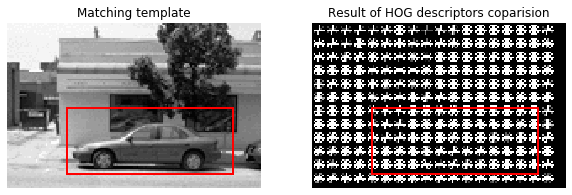

Image number  36


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


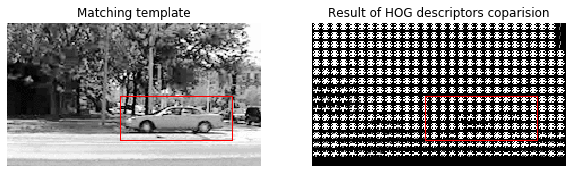

Image number  37


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


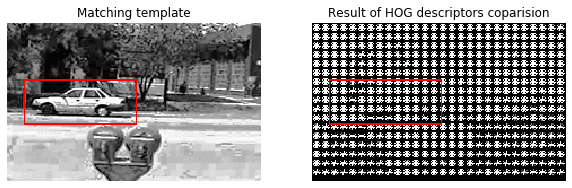

Image number  38


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


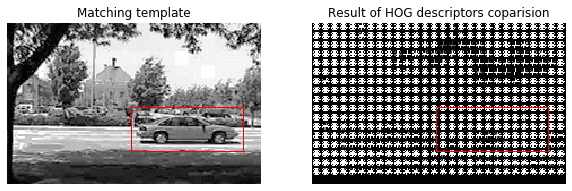

Image number  39


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


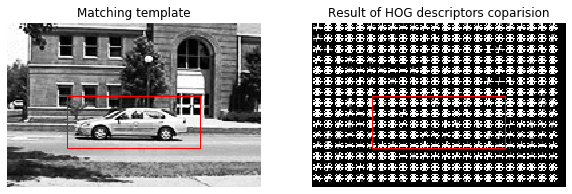

Image number  40


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


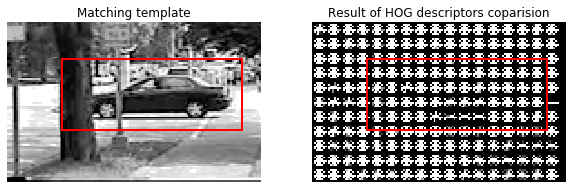

Image number  41


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


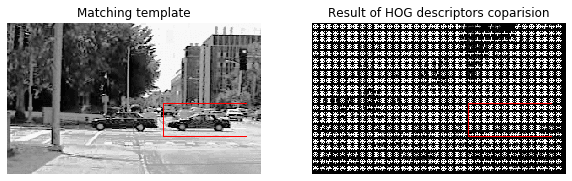

Image number  42


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


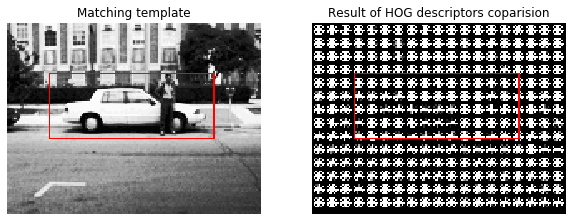

Image number  43


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


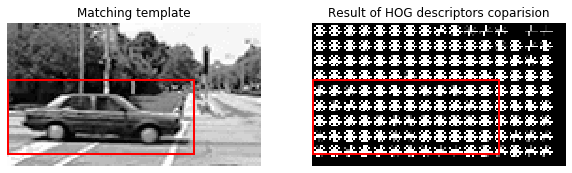

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image number  44


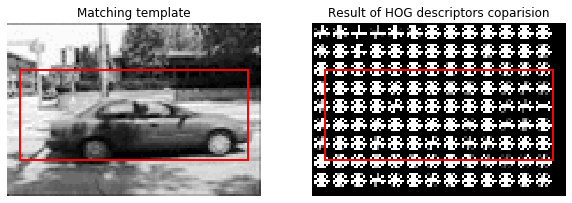

Image number  45


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


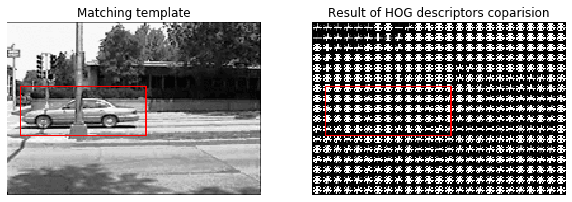

Image number  46


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


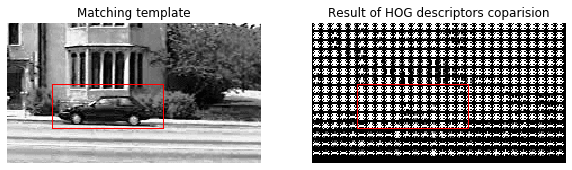

Image number  47


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


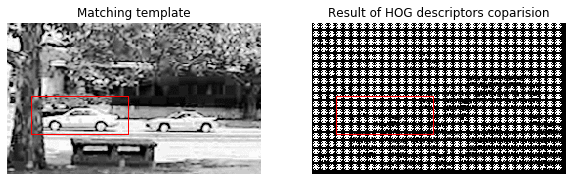

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image number  48


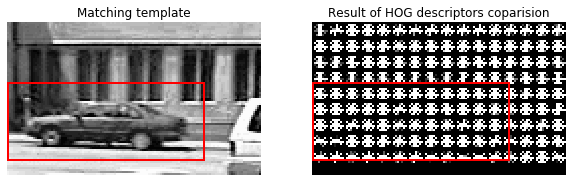

Image number  49


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


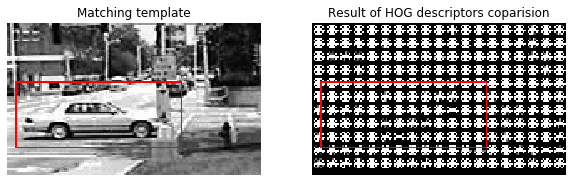

Image number  50


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


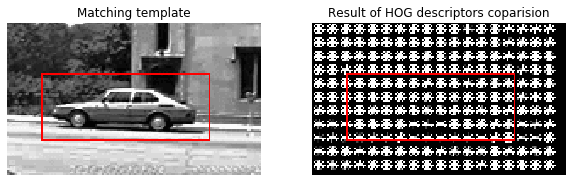

Image number  51


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


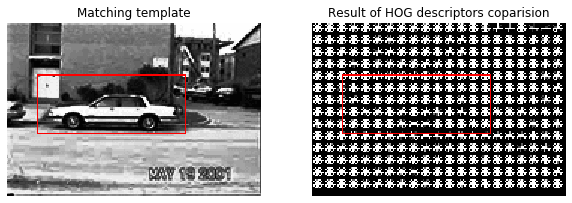

Image number  52


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


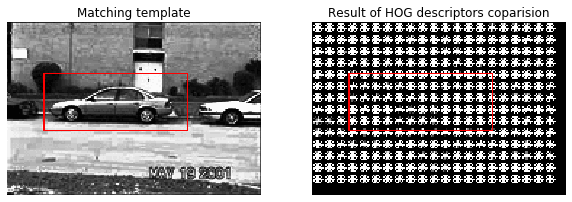

Image number  53


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


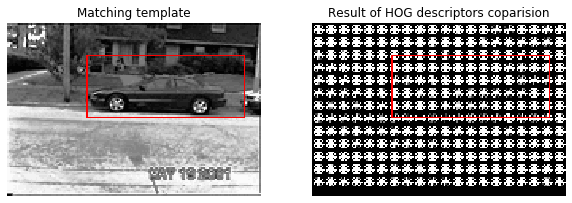

Image number  54


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


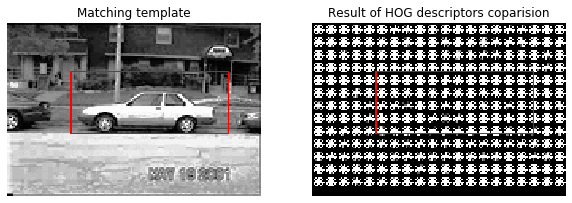

Image number  55


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


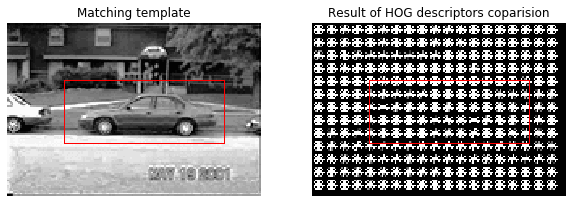

Image number  56


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


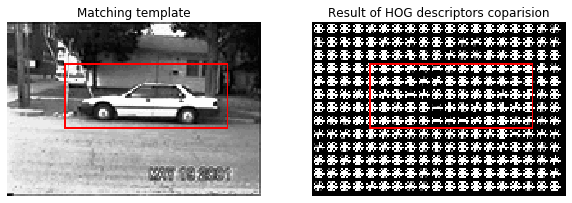

Image number  57


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


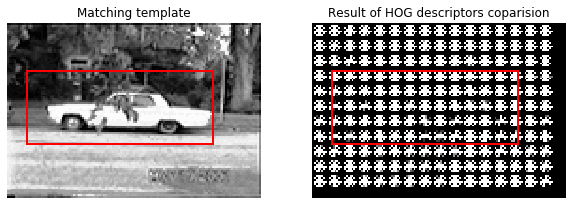

Image number  58


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


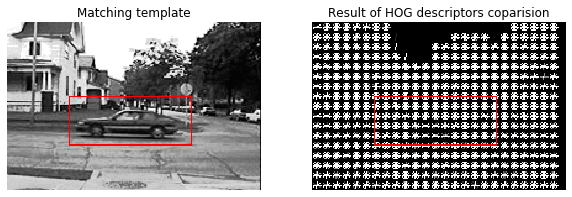

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image number  59


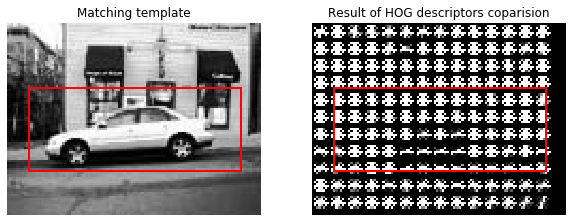

Image number  60


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


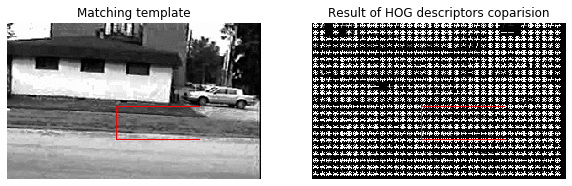

Image number  61


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


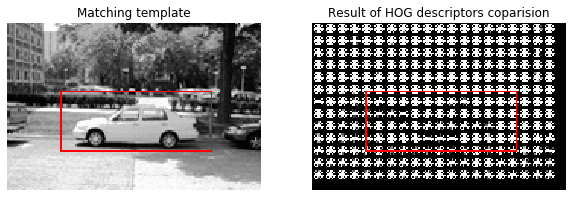

Image number  62


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


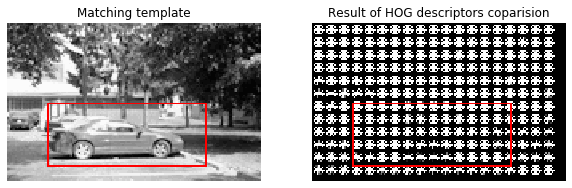

Image number  63


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


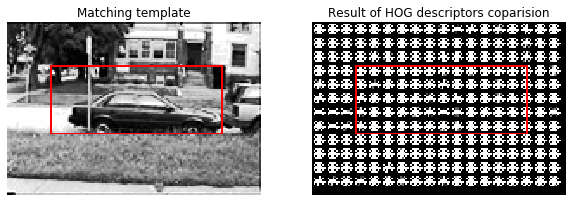

Image number  64


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


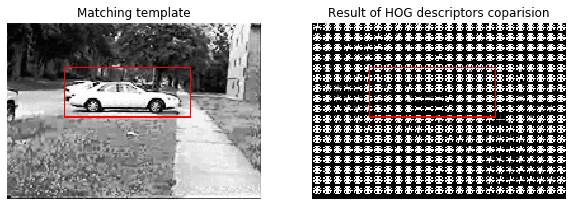

Image number  65


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


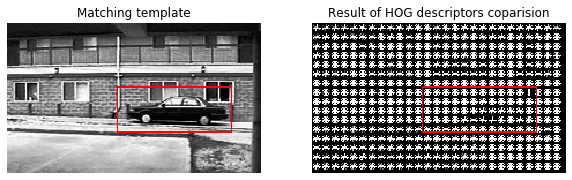

Image number  66


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


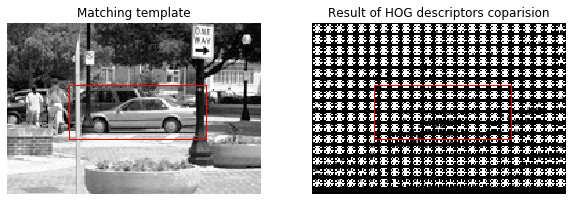

Image number  67


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


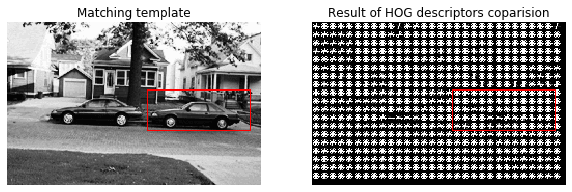

Image number  68


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


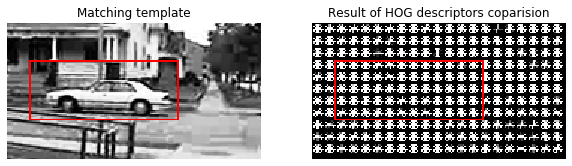

Image number  69


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


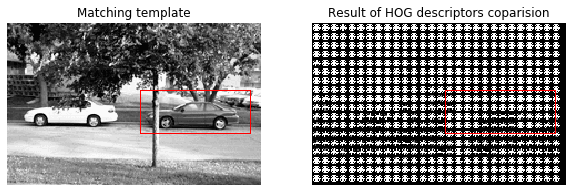

Image number  70


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


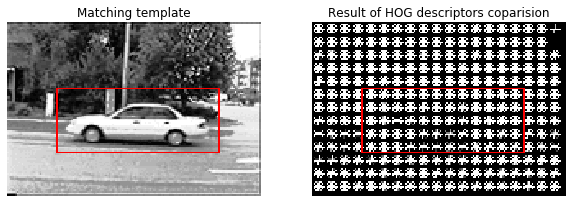

Image number  71


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


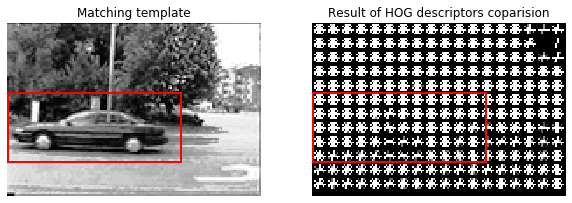

Image number  72


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


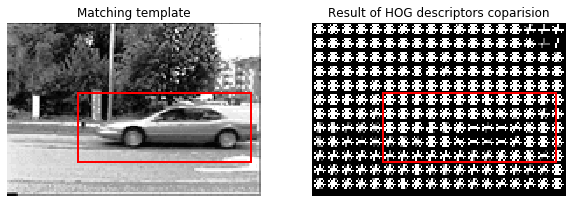

Image number  73


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


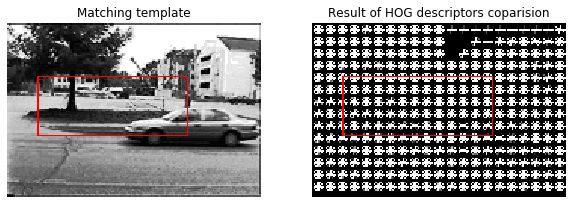

Image number  74


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


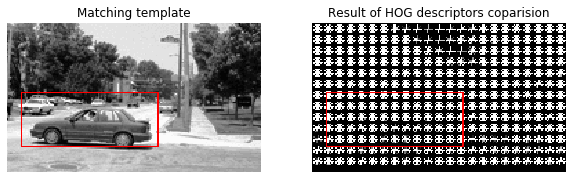

Image number  75


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


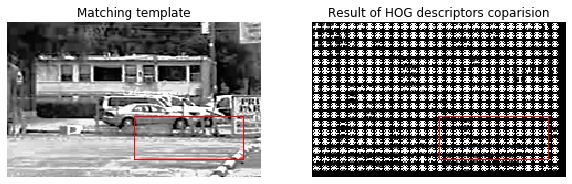

Image number  76


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


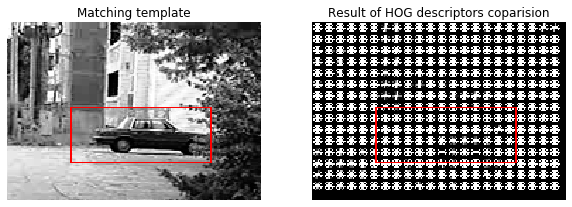

Image number  77


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


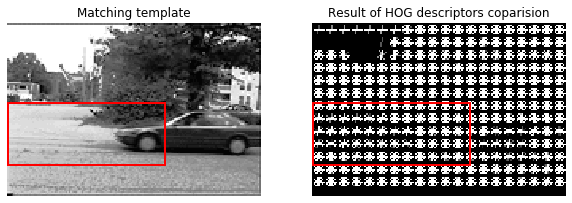

Image number  78


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


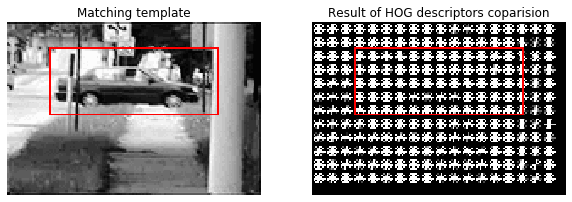

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image number  79


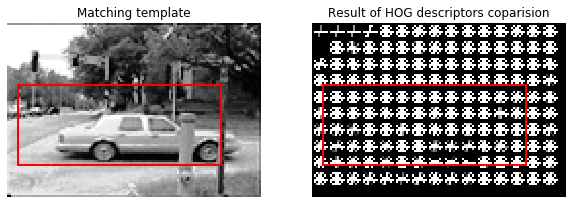

Image number  80


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


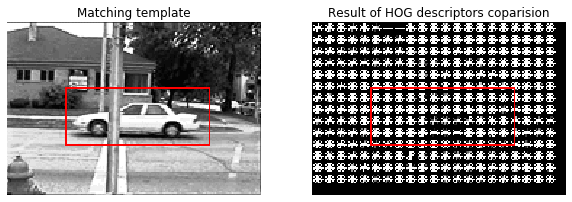

Image number  81


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


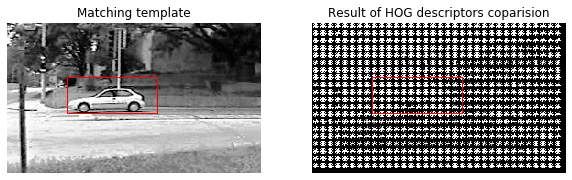

Image number  82


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


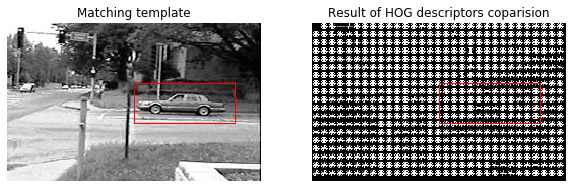

Image number  83


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


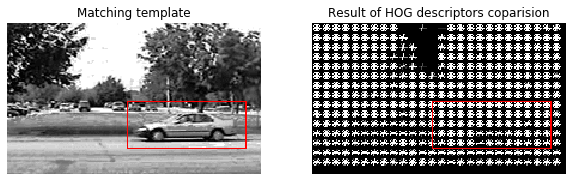

Image number  84


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


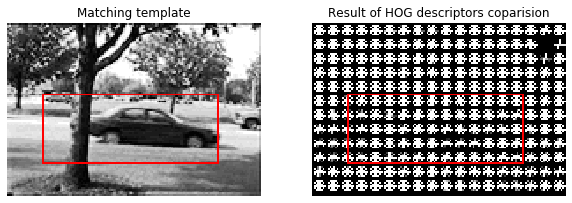

Image number  85


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


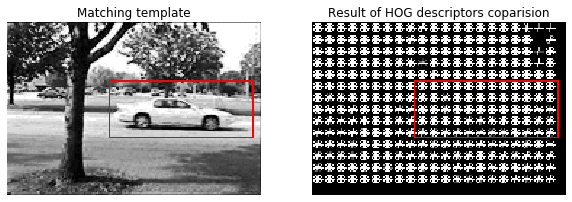

Image number  86


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


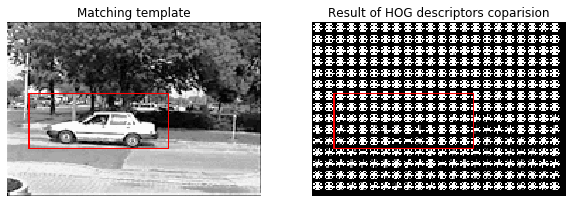

Image number  87


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


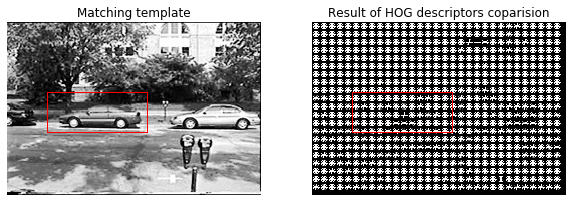

Image number  88


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


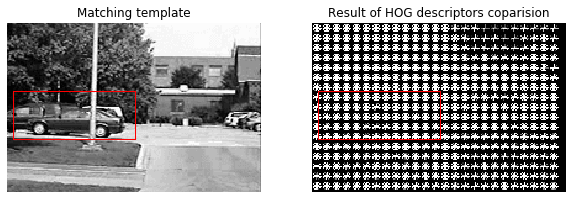

Image number  89


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


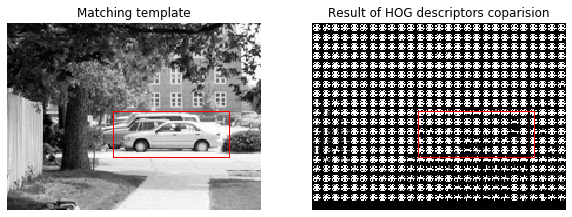

Image number  90


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


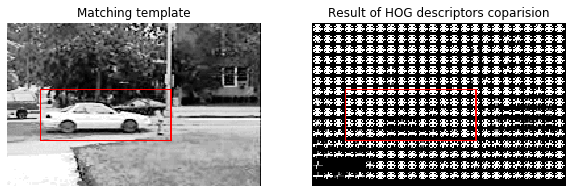

Image number  91


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


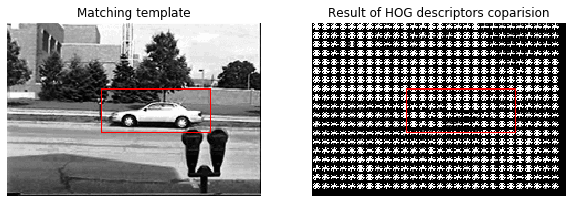

Image number  92


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


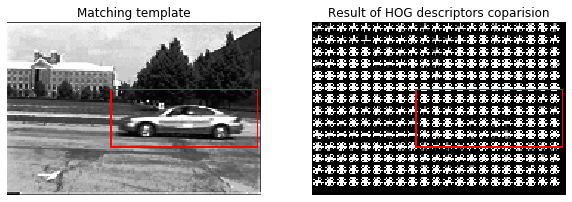

Image number  93


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


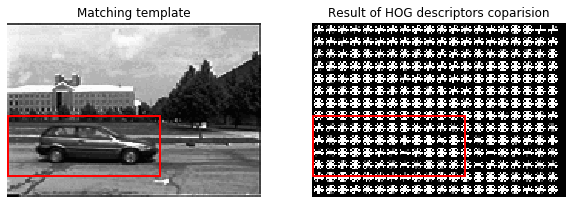

Image number  94


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


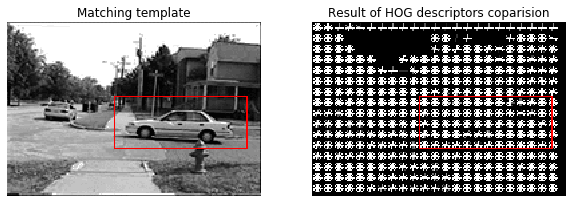

Image number  95


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


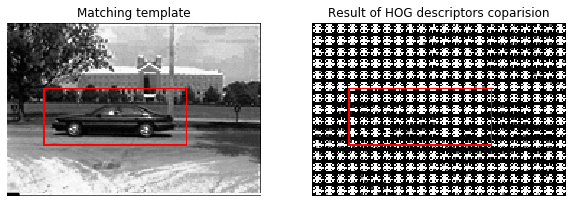

Image number  96


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


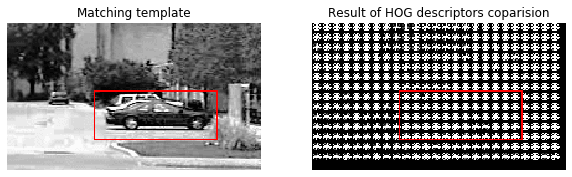

Image number  97


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


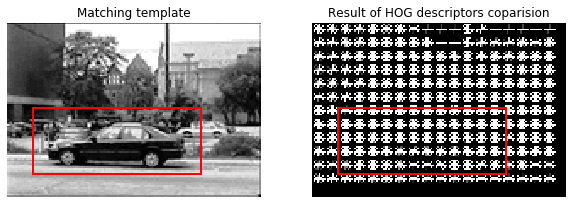

Image number  98


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


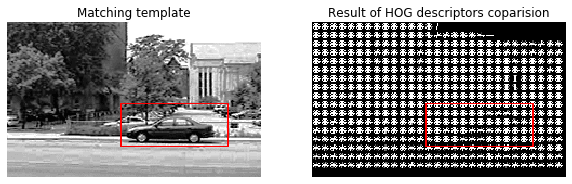

Image number  99


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


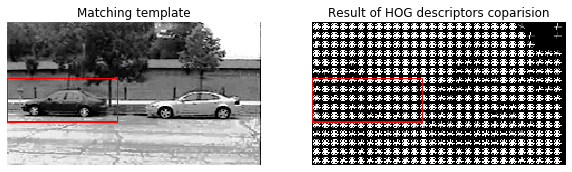

Image number  100


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


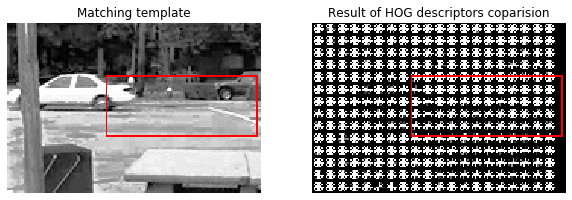

Image number  101


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


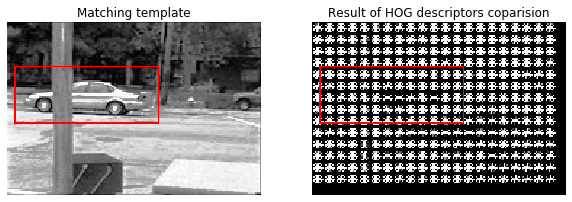

Image number  102


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


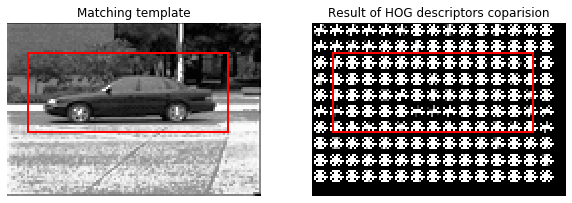

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image number  103


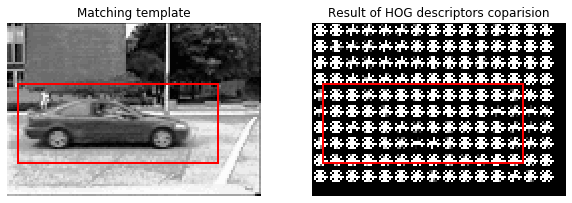

Image number  104


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


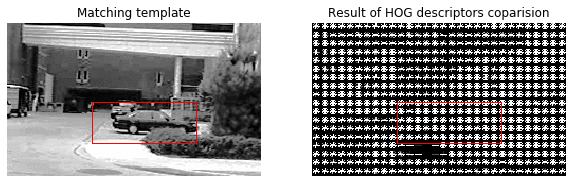

Image number  105


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


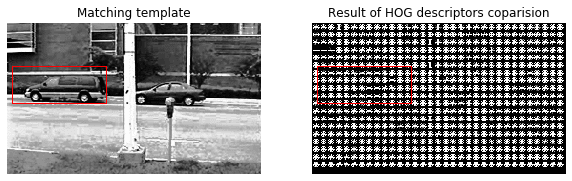

Image number  106


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


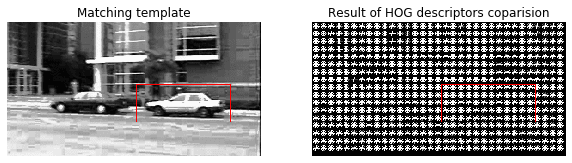

Image number  107


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


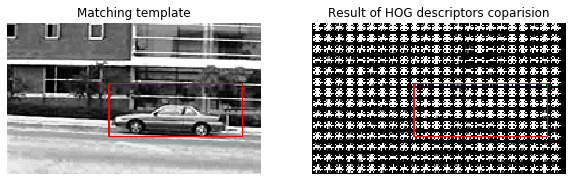

Image number  108


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


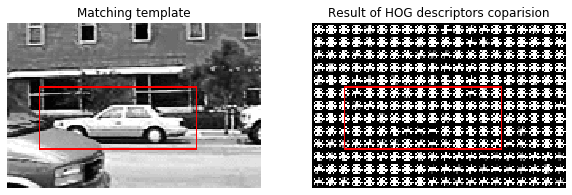

Image number  109


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


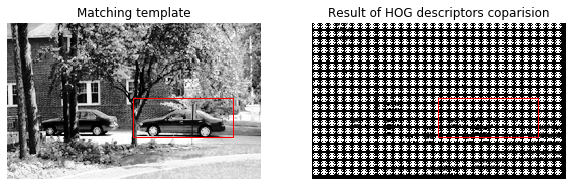

Image number  110


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


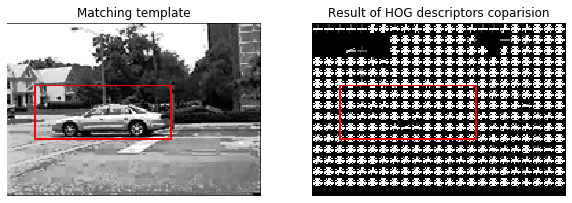

Image number  111


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


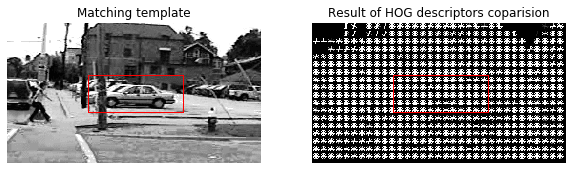

Image number  112


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


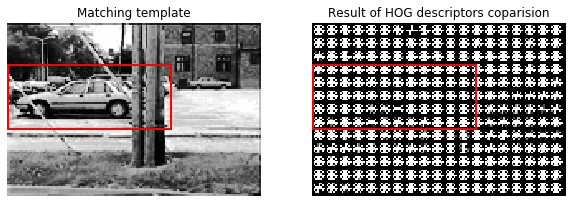

Image number  113


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


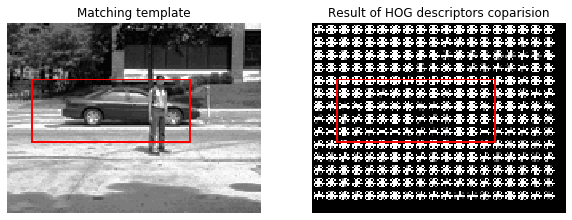

Image number  114


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


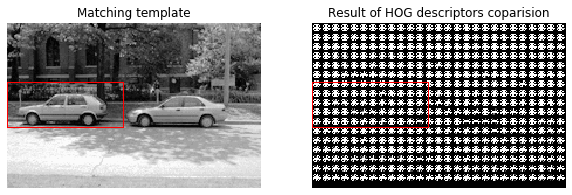

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image number  115


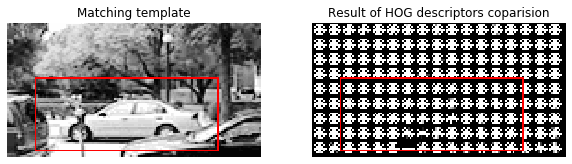

Image number  116


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


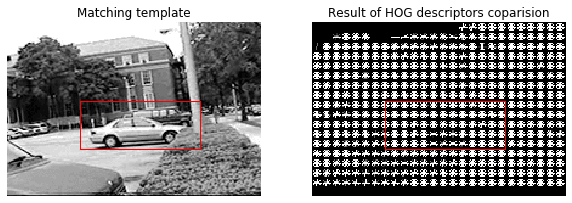

Image number  117


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


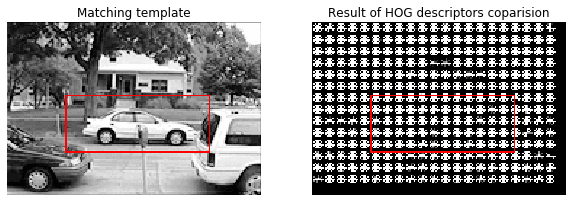

Image number  118


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


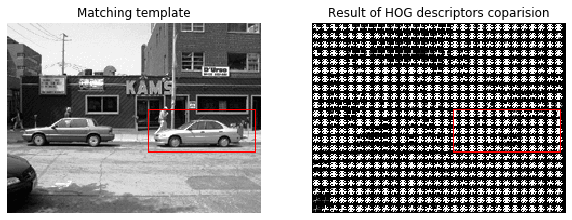

Image number  119


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


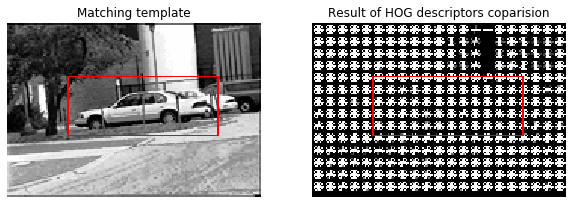

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image number  120


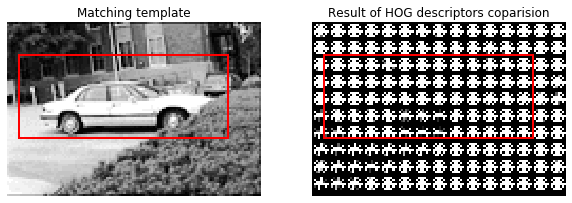

Image number  121


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


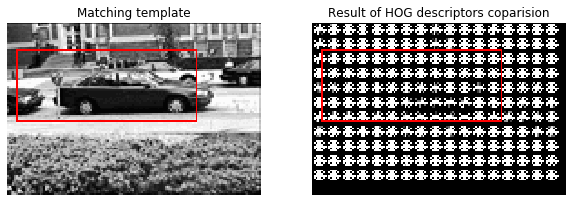

Image number  122


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


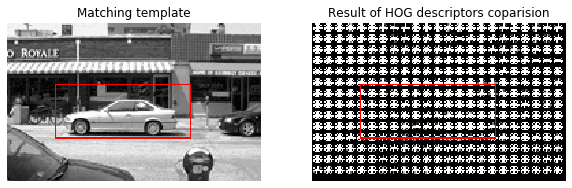

Image number  123


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


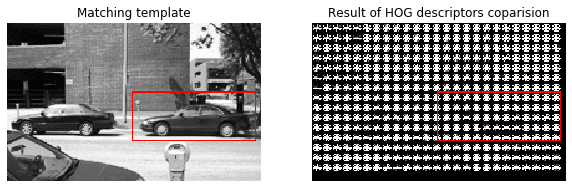

Image number  124


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


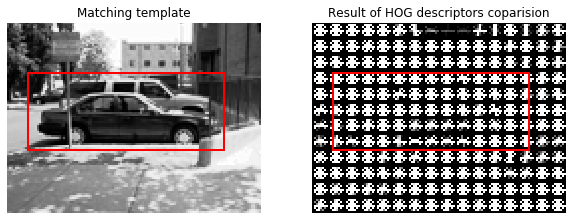

Image number  125


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


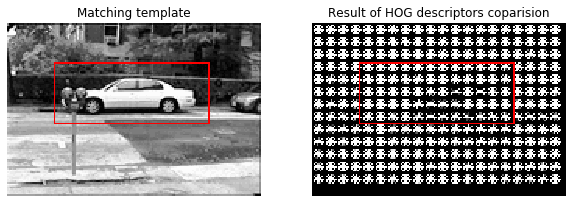

Image number  126


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


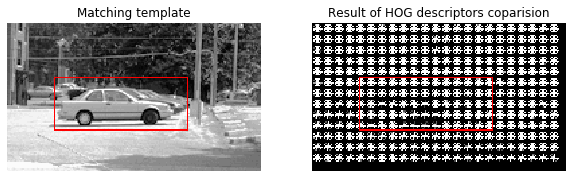

Image number  127


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


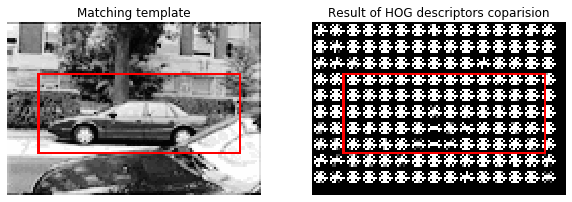

Image number  128


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


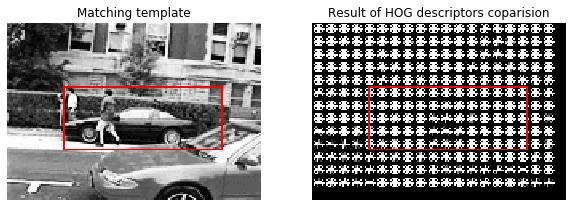

Image number  129


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


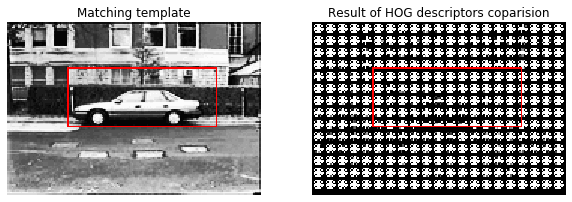

Image number  130


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


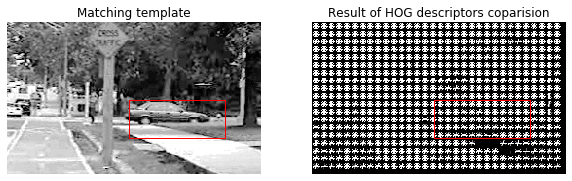

Image number  131


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


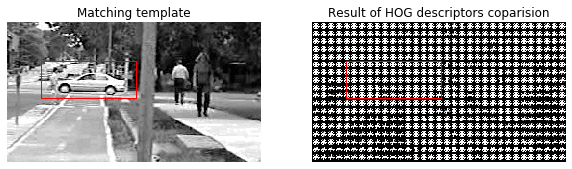

Image number  132


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


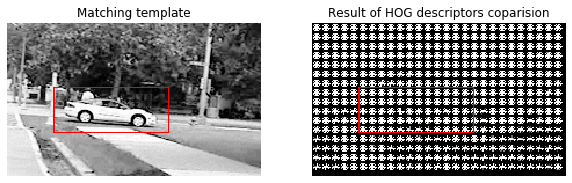

Image number  133


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


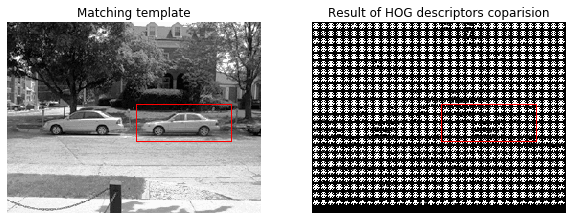

Image number  134


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


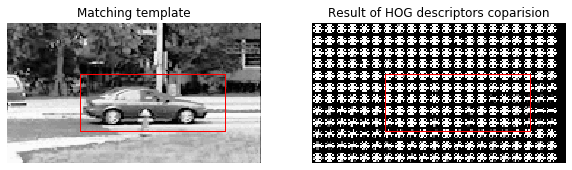

Image number  135


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


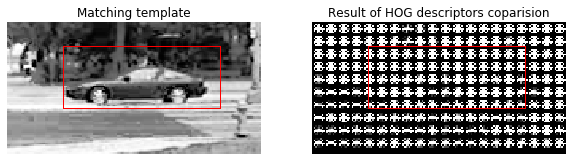

Image number  136


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


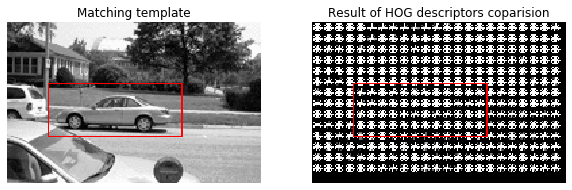

Image number  137


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


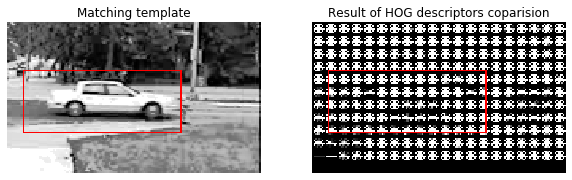

Image number  138


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


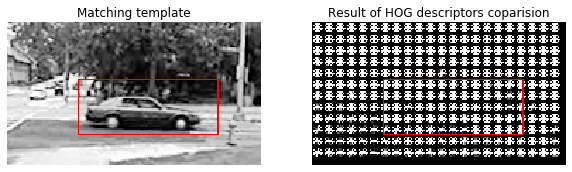

Image number  139


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


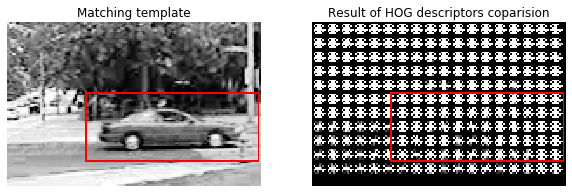

Image number  140


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


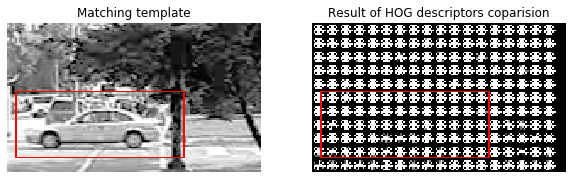

Image number  141


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


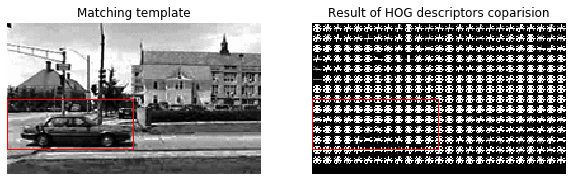

Image number  142


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


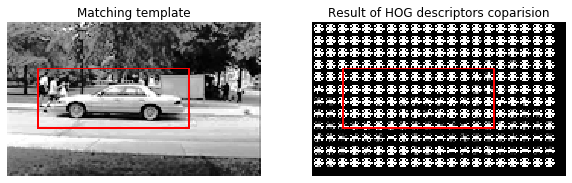

Image number  143


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


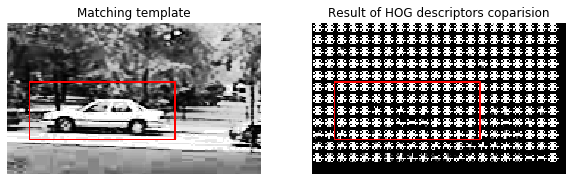

Image number  144


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


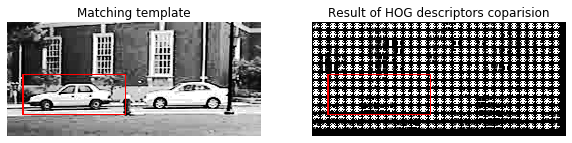

Image number  145


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


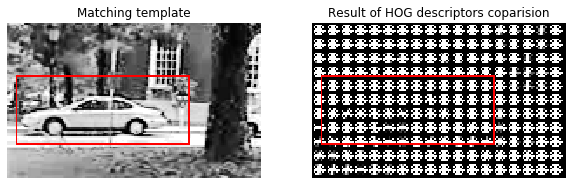

Image number  146


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


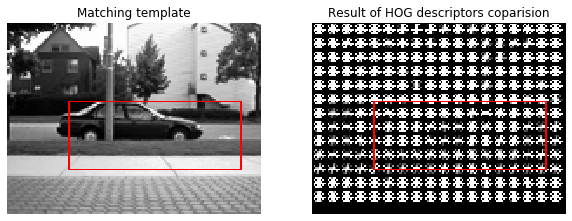

Image number  147


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


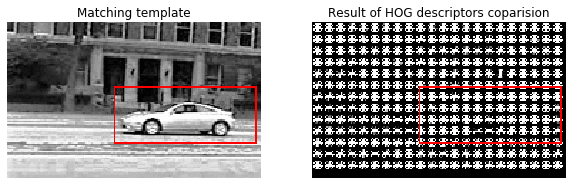

Image number  148


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


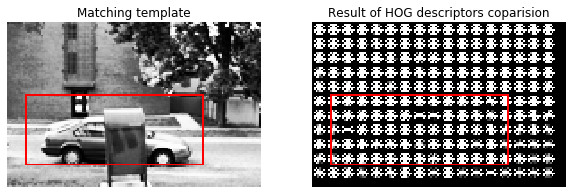

Image number  149


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


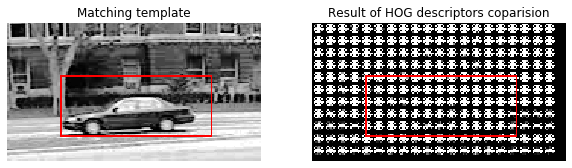

Image number  150


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


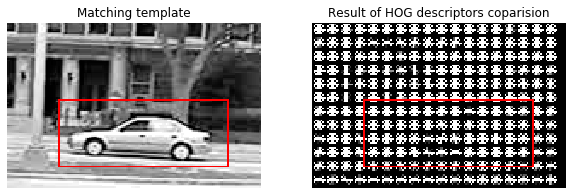

Image number  151


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


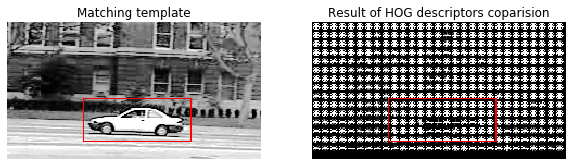

Image number  152


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


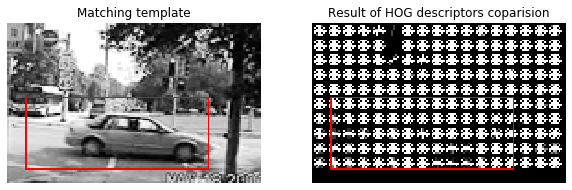

Image number  153


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


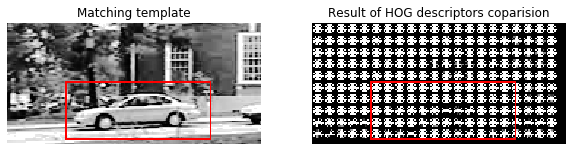

Image number  154


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


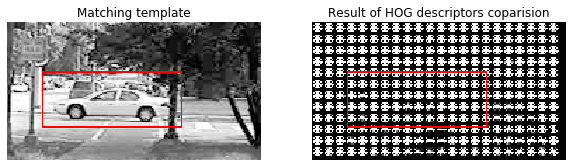

Image number  155


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


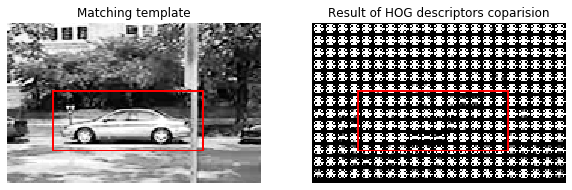

Image number  156


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


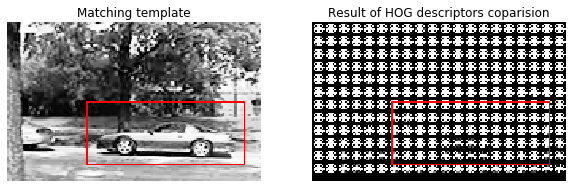

Image number  157


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


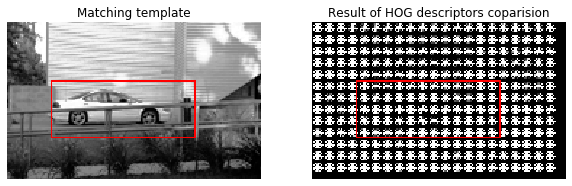

Image number  158


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


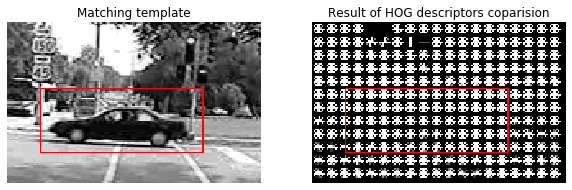

Image number  159


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


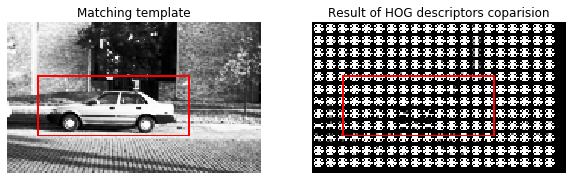

Image number  160


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


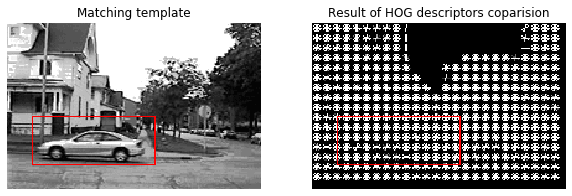

Image number  161


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


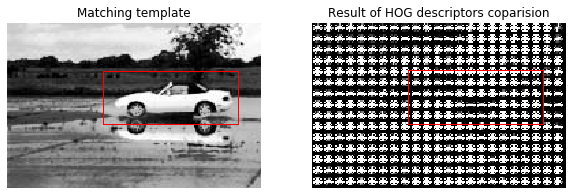

Image number  162


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


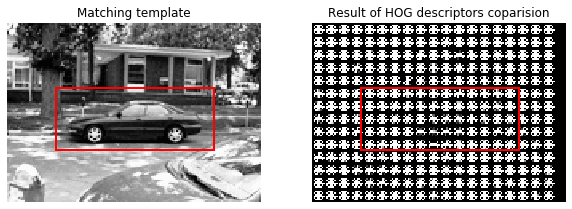

Image number  163


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


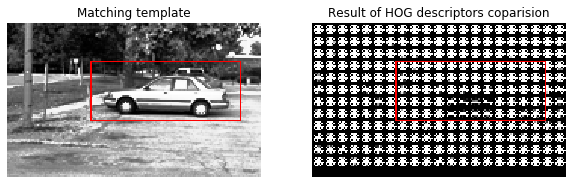

Image number  164


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


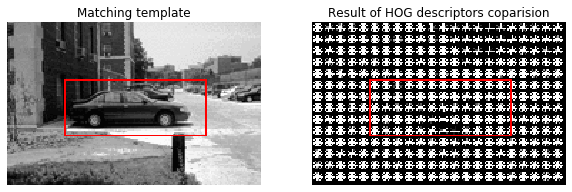

Image number  165


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


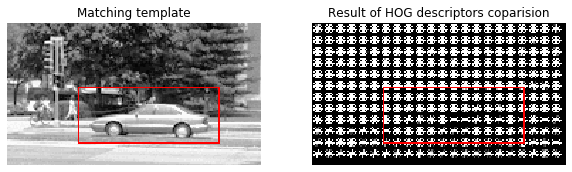

Image number  166


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


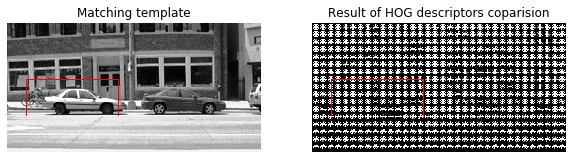

Image number  167


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


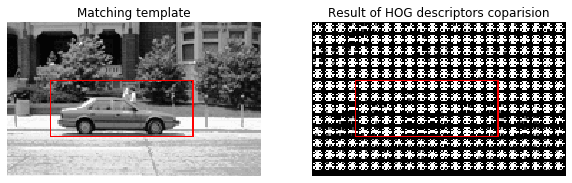

Image number  168


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


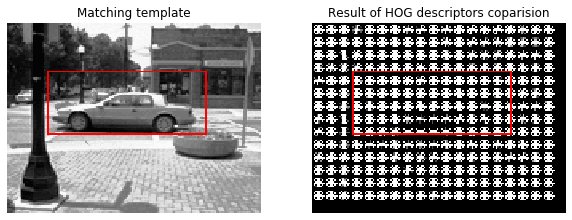

Image number  169


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


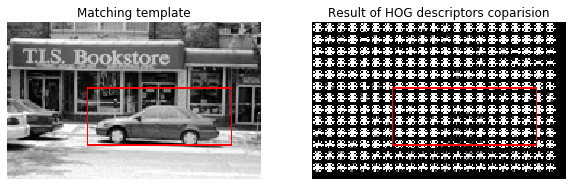

Image number  170


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


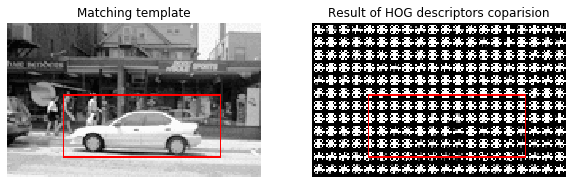

In [37]:
#b) Read images from the folder "car", slide a window on each image, obtain the HOG descriptor 
#and compare to the HOG descriptor of the car template.
#c) Visualize the location in the image that is the most similar to the car template. 

#Load all the images from "car" folder
car_images = io.ImageCollection('images/TestImages/*.pgm')

count = 0
#Apply the algorithm for all the images. It took a little time to the computer to get it all
for image_car in car_images:
    count += 1
    print("Image number ",count)
    match_hog(image_car, template, templ_desc)

### Answering questions

In our case, we use the squared norm of the differences between the window descriptor and the template descriptor. This is a good metric to determine which is the minimum difference between both descriptors (as we saw previously using euclidean distance technique). This is equivalent to compute only the norm of both descriptors.

With our implementation we get 8 out of 170 failed matches (we're not taking in account the imperfect matches). This failures are due to the dimension of any of the images used as the window in sliding window algorithm or other values in hog function. Maybe changing some of the values (or parameters to the function) as for example the step, will help in finding the perfect match.


If we make a search on the internet we find that HOG descriptor algorithm is a feature descriptor used in computer vision and image processing for the purpose of object detection. The technique counts occurrences of gradient orientation in localized portions of an image. It is also computed on a dense grid of uniformly spaced cells and uses overlapping local contrast normalization for improved accuracy.

So as we can see in this case we are comparing the diferences of the gradients on many regions on the image and the template not as we did before in euclidian distance and normal cross correlation. Due to this fact we finally found a way to surpass the previous technique's inconvenients. We can match two images not depending on if the template is not exactly contained in the image, or if the template is rotate or rescaled, or if the brightness in the image is modified respect other regions in the same.

For us, we've computed the algorithm between a single template descriptor and up to 150 images, and after many tries we arrive at the conclusion that the default values used in hog function aren't good enought to matching. We are getting a 5% of error. As we said before, this ratio could be less using diferent parameters on the hog function. The truth is that we've not found a nice improvement modifying this values.

# 4.3 ORB feature detector and binary descriptor

Let us consider the problem of feature extraction that contains two subproblems: 
- feature location, 
- image feature description.

In theory classes, we saw two feature extraction methods: SIFT and ORB. Let us focus on ORB.

**4.3.1** Check if ORB is  scale and rotation invariant, a property that is very important for real-time applications.

**Hint:** `ORB` is a function within the module `skimage.feature`
                             
**Help**: We suggest to have a look at the [ORB example](http://scikit-image.org/docs/dev/auto_examples/features_detection/plot_orb.html) how to compute the ORB descriptors and find the descriptors match. You can use the function match_descriptors from `skimage.feature` module in order to compute and show the similar detected descriptors of the given images. 

a) Detect the correspondences between the model image `starbucks.jpg` with the scene image `starbucks6.jpg`. You can adapt the code from the [ORB example](http://scikit-image.org/docs/dev/auto_examples/features_detection/plot_orb.html) above. Define the algorithm in terms of functions in order to be able to apply it on different images. Comment the code in detail.

Hint: If the function plot_matches() gives you an error you can use the plot_matches_aux() at the end of this file.

In [138]:
''' Visualization and ORB functions definition '''
"""
This function apply the ORB feature detector between 2 images and display the matches visually

:param image1: image1 to compare with image2
:param image2: image2 to compare with image1
"""
def ORB_feature_detector(image1, image2):
    #Extract descriptor with n_keypoints = 200 as in the example
    descriptor_extractor = ORB(n_keypoints=200)

    #Need the descriptors from both images
    descriptor_extractor.detect_and_extract(image1)
    keypoints1 = descriptor_extractor.keypoints #Get the points where we found a match
    descriptors1 = descriptor_extractor.descriptors
    
    descriptor_extractor.detect_and_extract(image2)
    keypoints2 = descriptor_extractor.keypoints #Get the points where we found a match
    descriptors2 = descriptor_extractor.descriptors

    #Here we're getting an array of pixels that match between the previous images
    matches12 = match_descriptors(descriptors1, descriptors2, cross_check=True)

    #Finally display the result of matching as in the example
    #Although there are 2 images, we only consider one to visualize the matches
    fig, ax = plt.subplots(nrows=1, ncols=1, figsize = (15,15))
    
    plt.gray()
    
    plot_matches(ax, image1, image2, keypoints1, keypoints2, matches12)
    ax.axis('off')
    ax.set_title("Image 1 compared with Image 2 using ORB feature descriptor")

    plt.show()

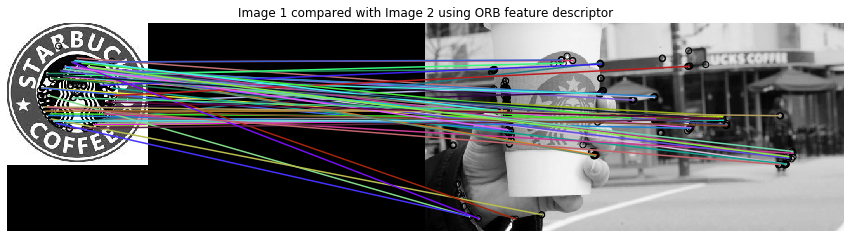

In [139]:
#First load the images
starbucks = io.imread('./images/starbucks.jpg')
starbucks_6 = io.imread('./images/starbucks6.jpg')

#Get the grayscale images to use the ORB feature descriptor
starbucks = color.rgb2gray(starbucks)
starbucks_6 = color.rgb2gray(starbucks_6)

#Now compute the ORB feature descriptor between the two previous images and display the result
ORB_feature_detector(starbucks, starbucks_6)

b) Repeate the experiment comparing the "starbucks.jpg" image as a model, and showing its matches to all Starbucks images, sorting them based on their similarity to the model. Comment when the algorithm works best. 

In [133]:
"""
Function that computes the matches on a hash with the image identificator inside image_array
and then displays in match increaing order

:param image_array: array with all the images
:param image_model: image to compare in ORB_feature_detector
"""
def sort_by_matches_and_visualize(image_array, image_model):
    aux_dict = {ORB_feature_detector_no_display(image_model, image_array[i]):i for i in range(len(image_array))}
    
    for img in sorted(aux_dict.keys()):
        ORB_feature_detector(image_model,image_array[aux_dict[img]])

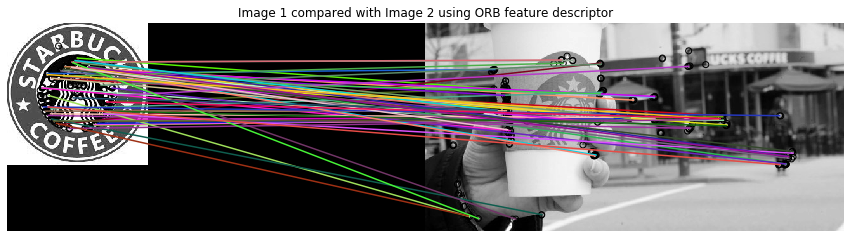

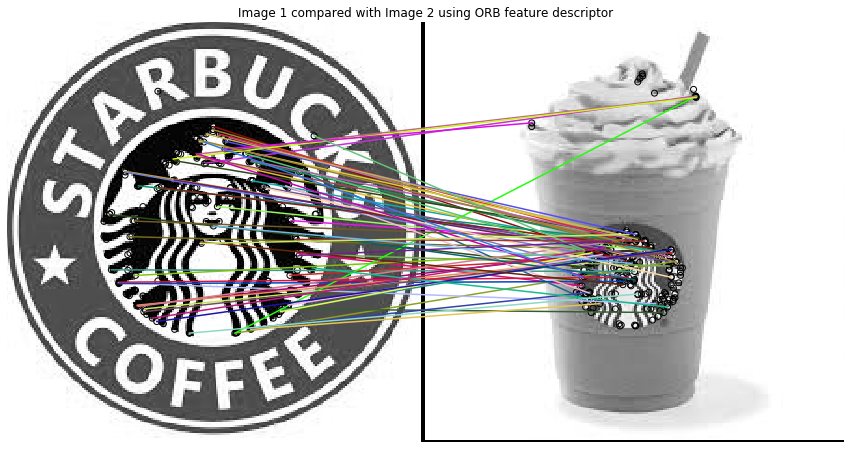

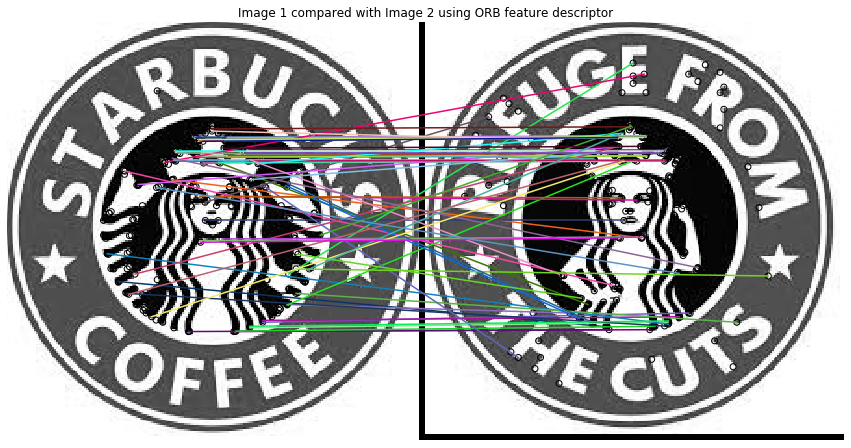

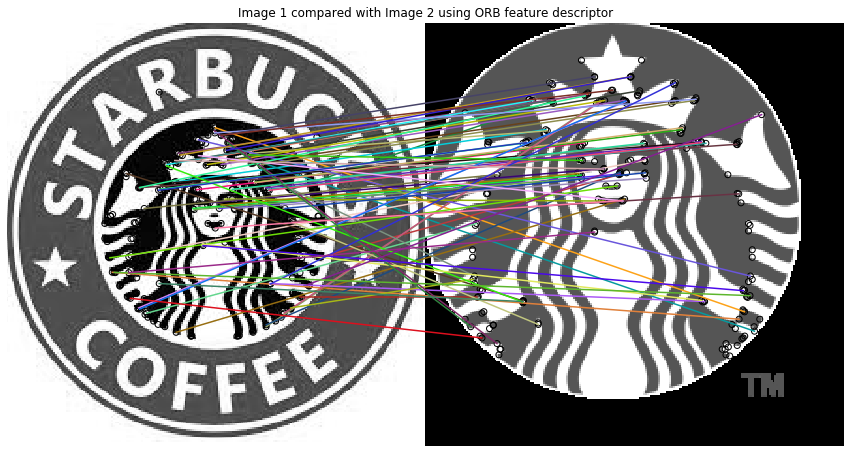

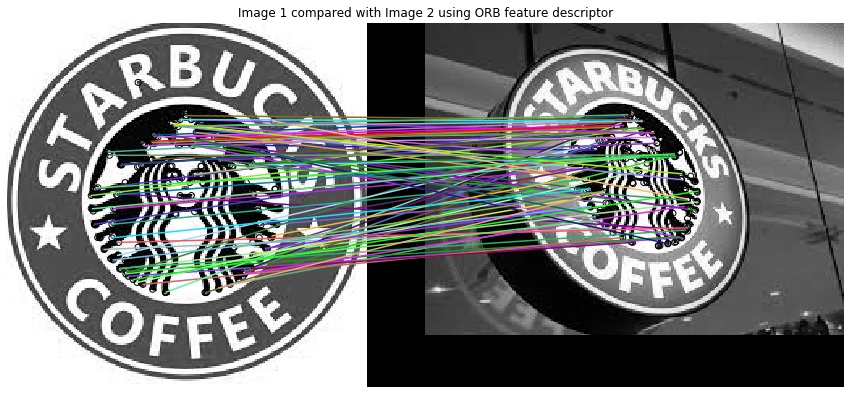

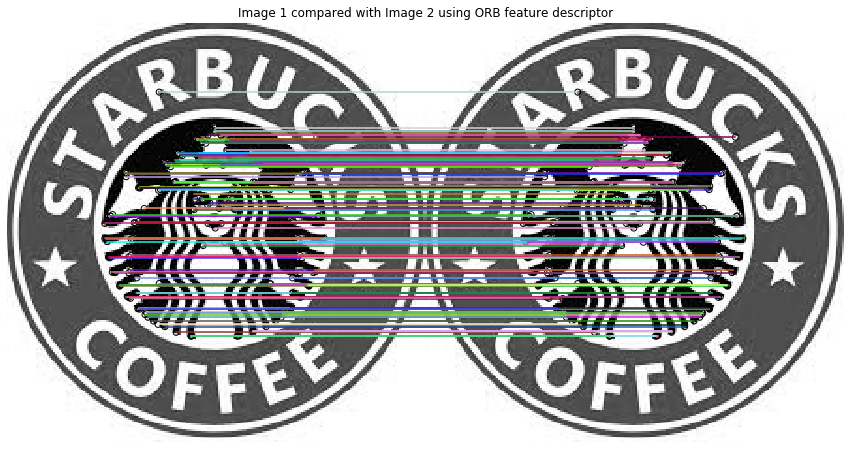

In [134]:
#Load the rest of the images we need
starbucks_2 = io.imread('./images/starbucks2.png')
starbucks_4 = io.imread('./images/starbucks4.jpg')
starbucks_5 = io.imread('./images/starbucks5.png')
starbucks_cup = io.imread('./images/starbucksCup.jpg')

#Get the grayscale images to use the ORB feature descriptor
starbucks_2 = color.rgb2gray(starbucks_2)
starbucks_4 = color.rgb2gray(starbucks_4)
starbucks_5 = color.rgb2gray(starbucks_5)
starbucks_cup = color.rgb2gray(starbucks_cup)

#Group them in an array
starbucks_images = [starbucks,starbucks_2,starbucks_4,starbucks_5,starbucks_6,starbucks_cup]

#Sort them in order of minor to maximum similarity and visualize
starbucks_sorted_by_similarity = sort_by_matches_and_visualize(starbucks_images, starbucks)

As we can see the ORB algorithm works best with those images that have a similar shape to the model image. For example the comparation between the same image in our case gives the maximum value stablished for n_keypoints.

c) Repeate the experiment in (b): 
- Changing the orientation of the model image by rotating it and comparing it with its original version. Help: you can use the rotate() function from skimage.transform 
- Change the scale and orientation of the scene image and compare it with the model image.

Help: To do so, you can use the function given below as example:

import transform as tf
rotationdegrees = 180
img_rotated = tf.rotate(image2transform, rotationdegrees)

or

tform = tf.AffineTransform(scale=(1.2, 1.2), translation=(0, -100))
img_transformed = tf.warp(image2transform, tform)

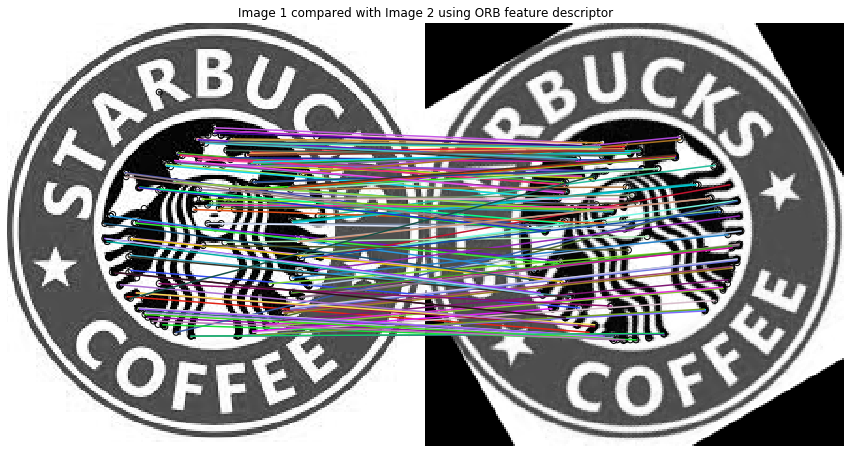

The number of matches are  145


In [149]:
#Rotate random degrees (from 0 to 360) the image and apply ORB
starbucks_r = transform.rotate(starbucks, random.randint(0, 360))
ORB_feature_detector(starbucks,starbucks_r)
print("The number of matches are ",ORB_feature_detector_no_display(starbucks,starbucks_r))

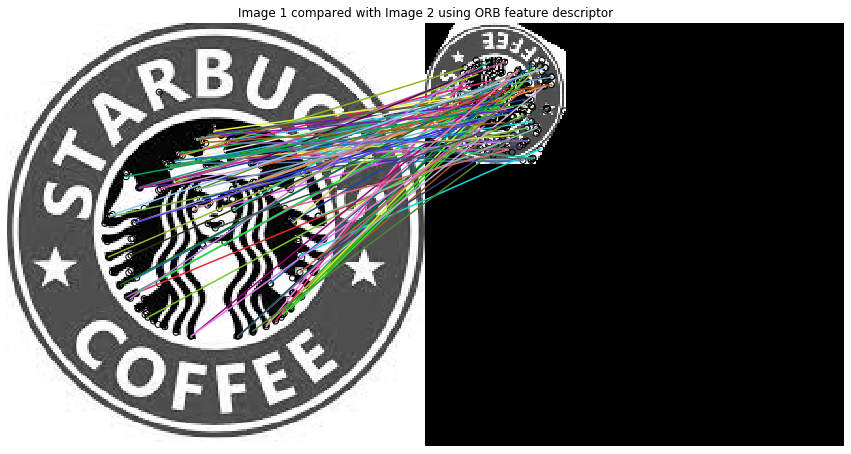

The number of matches are  84


In [169]:
#Rotate random degrees (from 0 to 360) the image 
starbucks_r = transform.rotate(starbucks, random.randint(0,360))

#Randomly rescaled
tform = transform.AffineTransform(scale=(random.randint(1,3), random.randint(1,3)))
starbucks_rescaled = transform.warp(starbucks_r, tform)

#Apply the ORB
ORB_feature_detector(starbucks,starbucks_rescaled)
print("The number of matches are ",ORB_feature_detector_no_display(starbucks,starbucks_rescaled))

### Answer to the question

As we can see ORB feature detection algorithm is not invariant to rotation and scale. We could observe this fact in the past two experiments; when we were finding the matches between all the images, and also when we rotate and rescale between two identical images. More precisely we can observe that the number of matches variate when rotating and reescaling.

**Optional:** Repeate the experiment with a new group of images. You could use Coca-Cola advertisements or from another famous brand, easily to find on internet.



### Analysis of the applied techniques and results

- What are the advantages of the ORB object detection with respect to the HOG and template object detector?

- What would happen if you analyse an image that does not contain the Starbucks logo? 

- Could you think of ways of defining a quality measure for the correspondance between two images? (no need of implementing it) 

If we compare ORB object detection and HOG, we can see that ORB is less sensitive to a rotation. ORB is better finding objects in an image because it finds points of the objects and then compares them with the other images points in order to match them. They are similar because both works getting its descriptors.

As we said, if we analyse an image that does not contain the Starbucks logo the algorithm will find other similar points in the image as we saw previously with one of the images.

A way of defining a quality measure for the correspondance between two images could be the one implemented in SIFT algorithm, which analyse the corners and also the parallel lines in the images.

## Delivery

All code sould be commented in English. Answers of the questions should be given in English too.

Compressed file **P4_Student1_Student2.zip** that includes:
- The notebook P1_Student1_Student2.ipynb completed with the solutions to the exercises and their corresponding comments.
- The images used that are not provided in P1.zip.

**Deadline (Campus Virtual): November 26th, 23:59.** 

In [39]:
#Appendix: In case the plot_matches() function gives you some problems, you can use the following one:

from skimage.util import img_as_float
import numpy as np

def plot_matches_aux(ax, image1, image2, keypoints1, keypoints2, matches,
                 keypoints_color='k', matches_color=None, only_matches=False):
    """Plot matched features.
    Parameters
    ----------
    ax : matplotlib.axes.Axes
        Matches and image are drawn in this ax.
    image1 : (N, M [, 3]) array
        First grayscale or color image.
    image2 : (N, M [, 3]) array
        Second grayscale or color image.
    keypoints1 : (K1, 2) array
        First keypoint coordinates as ``(row, col)``.
    keypoints2 : (K2, 2) array
        Second keypoint coordinates as ``(row, col)``.
    matches : (Q, 2) array
        Indices of corresponding matches in first and second set of
        descriptors, where ``matches[:, 0]`` denote the indices in the first
        and ``matches[:, 1]`` the indices in the second set of descriptors.
    keypoints_color : matplotlib color, optional
        Color for keypoint locations.
    matches_color : matplotlib color, optional
        Color for lines which connect keypoint matches. By default the
        color is chosen randomly.
    only_matches : bool, optional
        Whether to only plot matches and not plot the keypoint locations.
    """

    image1 = img_as_float(image1)
    image2 = img_as_float(image2)

    new_shape1 = list(image1.shape)
    new_shape2 = list(image2.shape)

    if image1.shape[0] < image2.shape[0]:
        new_shape1[0] = image2.shape[0]
    elif image1.shape[0] > image2.shape[0]:
        new_shape2[0] = image1.shape[0]

    if image1.shape[1] < image2.shape[1]:
        new_shape1[1] = image2.shape[1]
    elif image1.shape[1] > image2.shape[1]:
        new_shape2[1] = image1.shape[1]

    if new_shape1 != image1.shape:
        new_image1 = np.zeros(new_shape1, dtype=image1.dtype)
        new_image1[:image1.shape[0], :image1.shape[1]] = image1
        image1 = new_image1

    if new_shape2 != image2.shape:
        new_image2 = np.zeros(new_shape2, dtype=image2.dtype)
        new_image2[:image2.shape[0], :image2.shape[1]] = image2
        image2 = new_image2

    image = np.concatenate([image1, image2], axis=1)

    offset = image1.shape

    if not only_matches:
        ax.scatter(keypoints1[:, 1], keypoints1[:, 0],
                   facecolors='none', edgecolors=keypoints_color)
        ax.scatter(keypoints2[:, 1] + offset[1], keypoints2[:, 0],
                   facecolors='none', edgecolors=keypoints_color)

    ax.imshow(image, interpolation='nearest', cmap='gray')
    ax.axis((0, 2 * offset[1], offset[0], 0))

    for i in range(matches.shape[0]):
        idx1 = matches[i, 0]
        idx2 = matches[i, 1]

        if matches_color is None:
            color = np.random.rand(3)
        else:
            color = matches_color

        ax.plot((keypoints1[idx1, 1], keypoints2[idx2, 1] + offset[1]),
                (keypoints1[idx1, 0], keypoints2[idx2, 0]),
                '-', color=color)